### References

https://www.thepythoncode.com/article/stock-price-prediction-in-python-using-tensorflow-2-and-keras

# Train models

Train and save models

### Google Drive Connect

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### GPU Detect

Boost computational power using GPU. Comment the following code if you face runtime limits issues and to save GPU node hours charges.

In [2]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


### Import dependencies

In [3]:
!pip install pandas numpy matplotlib yahoo_fin sklearn
from IPython.display import clear_output 
clear_output()

In [4]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from yahoo_fin import stock_info as si
from collections import deque
import tensorflow.keras.metrics
import os
import numpy as np
import pandas as pd
import random
import os
import time
from tensorflow.keras.layers import LSTM
tensorflow.random.set_seed(2)
import matplotlib.pyplot as plt
from keras.models import Sequential, load_model
from keras.layers.core import Dense
from keras.layers.recurrent import LSTM
from keras import optimizers
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt
import datetime
import progressbar
import warnings
import concurrent.futures
warnings.filterwarnings("ignore")
plt.style.use('ggplot')
import matplotlib.pyplot as plt
# set seed, so we can get the same results after rerunning several times
np.random.seed(314)
tf.random.set_seed(314)
random.seed(314)

## Prepare Dataset

In [5]:
def shuffle_in_unison(a, b):
    # shuffle two arrays in the same way
    state = np.random.get_state()
    np.random.shuffle(a)
    np.random.set_state(state)
    np.random.shuffle(b)

def load_data(ticker, n_steps=50, scale=True, shuffle=True, lookup_step=1, split_by_date=True,
                test_size=0.2, feature_columns=['adj_close', 'volume', 'open', 'high', 'low'], filename=os.path.join("/content/drive/My Drive/Master Project/Dataset/stock_market_datasets/market_historic/{}.csv".format("PLTR"))):
    """
    Loads data from Yahoo Finance source, as well as scaling, shuffling, normalizing and splitting.
    Params:
        ticker (str/pd.DataFrame): the ticker you want to load, examples include AAPL, TSLA, etc.
        n_steps (int): the historical sequence length (i.e window size) used to predict, default is 50
        scale (bool): whether to scale prices from 0 to 1, default is True
        shuffle (bool): whether to shuffle the dataset (both training & testing), default is True
        lookup_step (int): the future lookup step to predict, default is 1 (e.g next day)
        split_by_date (bool): whether we split the dataset into training/testing by date, setting it 
            to False will split datasets in a random way
        test_size (float): ratio for test data, default is 0.2 (20% testing data)
        feature_columns (list): the list of features to use to feed into the model, default is everything grabbed from yahoo_fin
    """
    # see if ticker is already a loaded stock from yahoo finance
    #if isinstance(ticker, str):
        # load it from yahoo_fin library
        #df = si.get_data(ticker)
        #df=pd.read_csv(filename)
    #elif isinstance(ticker, pd.DataFrame):
        # already loaded, use it directly
        #df = ticker
    #else:
        #raise TypeError("ticker can be either a str or a `pd.DataFrame` instances")
    # this will contain all the elements we want to return from this function
    df=pd.read_csv(filename)
    df['9-day'] = df['adj_close'].rolling(9).mean()
    df['21-day'] = df['adj_close'].rolling(21).mean()
    df['50-day'] = df['adj_close'].rolling(50).mean()
    df['200-day'] = df['adj_close'].rolling(200).mean()
    #feature_columns=df.columns
    result = {}
    # we will also return the original dataframe itself
    result['df'] = df.copy()
    # make sure that the passed feature_columns exist in the dataframe
    for col in feature_columns:
        assert col in df.columns, f"'{col}' does not exist in the dataframe."
    # add date as a column
    #if "date" not in df.columns:
    df["date"] = df.index
    if scale:
        column_scaler = {}
        # scale the data (prices) from 0 to 1
        for column in feature_columns:
            scaler = preprocessing.MinMaxScaler()
            df[column] = scaler.fit_transform(np.expand_dims(df[column].values, axis=1))
            column_scaler[column] = scaler
        # add the MinMaxScaler instances to the result returned
        result["column_scaler"] = column_scaler
    # add the target column (label) by shifting by `lookup_step`
    df['future'] = df['adj_close'].shift(-lookup_step)
    # last `lookup_step` columns contains NaN in future column
    # get them before droping NaNs
    last_sequence = np.array(df[feature_columns].tail(lookup_step))
    # drop NaNs
    df.dropna(inplace=True)
    sequence_data = []
    sequences = deque(maxlen=n_steps)
    for entry, target in zip(df[feature_columns + ["date"]].values, df['future'].values):
        sequences.append(entry)
        if len(sequences) == n_steps:
            sequence_data.append([np.array(sequences), target])
    # get the last sequence by appending the last `n_step` sequence with `lookup_step` sequence
    # for instance, if n_steps=50 and lookup_step=10, last_sequence should be of 60 (that is 50+10) length
    # this last_sequence will be used to predict future stock prices that are not available in the dataset
    last_sequence = list([s[:len(feature_columns)] for s in sequences]) + list(last_sequence)
    last_sequence = np.array(last_sequence).astype(np.float32)
    # add to result
    result['last_sequence'] = last_sequence
    # construct the X's and y's
    X, y = [], []
    for seq, target in sequence_data:
        X.append(seq)
        y.append(target)
    # convert to numpy arrays
    X = np.array(X)
    y = np.array(y)
    if split_by_date:
        # split the dataset into training & testing sets by date (not randomly splitting)
        train_samples = int((1 - test_size) * len(X))
        result["X_train"] = X[:train_samples]
        result["y_train"] = y[:train_samples]
        result["X_test"]  = X[train_samples:]
        result["y_test"]  = y[train_samples:]
        if shuffle:
            # shuffle the datasets for training (if shuffle parameter is set)
            shuffle_in_unison(result["X_train"], result["y_train"])
            shuffle_in_unison(result["X_test"], result["y_test"])
    else:    
        # split the dataset randomly
        result["X_train"], result["X_test"], result["y_train"], result["y_test"] = train_test_split(X, y, 
                                                                                test_size=test_size, shuffle=shuffle)
    # get the list of test set dates
    dates = result["X_test"][:, -1, -1]
    # retrieve test features from the original dataframe
    result["test_df"] = result["df"].loc[dates]
    # remove duplicated dates in the testing dataframe
    result["test_df"] = result["test_df"][~result["test_df"].index.duplicated(keep='first')]
    # remove dates from the training/testing sets & convert to float32
    result["X_train"] = result["X_train"][:, :, :len(feature_columns)].astype(np.float32)
    result["X_test"] = result["X_test"][:, :, :len(feature_columns)].astype(np.float32)
    return result

## Model

In [6]:
def create_model(sequence_length, n_features, units=256, cell=LSTM, n_layers=2, dropout=0.3,
                loss="mean_absolute_error", optimizer="rmsprop", bidirectional=False):
    model = Sequential()
    for i in range(n_layers):
        if i == 0:
            # first layer
            if bidirectional:
                model.add(Bidirectional(cell(units, return_sequences=True), batch_input_shape=(None, sequence_length, n_features)))
            else:
                model.add(cell(units, return_sequences=True, batch_input_shape=(None, sequence_length, n_features)))
        elif i == n_layers - 1:
            # last layer
            if bidirectional:
                model.add(Bidirectional(cell(units, return_sequences=False)))
            else:
                model.add(cell(units, return_sequences=False))
        else:
            # hidden layers
            if bidirectional:
                model.add(Bidirectional(cell(units, return_sequences=True)))
            else:
                model.add(cell(units, return_sequences=True))
        # add dropout after each layer
        model.add(Dropout(dropout))
    model.add(Dense(1, activation="linear"))
    model.compile(loss=loss, metrics=["mean_absolute_error"], optimizer=optimizer)
    return model

### Set Status

In [7]:
def set_status(ticker_number,fname,func_type):
  ticker_number=str(ticker_number)
  with open(f'/content/drive/My Drive/Master Project/Dataset/logs/{fname}_{func_type}_stat.txt', 'w') as writefile:
      writefile.write(ticker_number)
def get_status(fname,func_type):
  ticker_number=0
  try:
    with open(f'/content/drive/My Drive/Master Project/Dataset/logs/{fname}_{func_type}_stat.txt', 'r') as logfile:
      ticker_number=int(logfile.read())
  except:
    pass
  return ticker_number

## Train Model

In [8]:
def plot_graph(test_df,LOOKUP_STEP=1,ticker="EBAY"):
    """
    This function plots true close price along with predicted close price
    with blue and red colors respectively
    """
    plt.figure(figsize=(14,6))
    #plt.autoscale()
    #plt.plot(test_df[f'true_adj_close_{LOOKUP_STEP}'], c='b')
    plt.plot(test_df[f'true_adj_close_{LOOKUP_STEP}_days'], c='b')
    plt.plot(test_df[f'adj_close_{LOOKUP_STEP}_days'], c='r')
    plt.plot(test_df['50-day'], c='g')
    #plt.plot(test_df['200-day'])
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend(["Actual Price","Predicted Price", "50 day MA"])
    plt.title(f"{ticker} predictions chart")
    plt.savefig(f"/content/drive/My Drive/Master Project/Dataset/stock_market_datasets/market_historic_forecast_images/{ticker}.png")
    #plt.legend(["Actual Price","Predicted Price"])
    #plt.legend(["Predicted Price", "50 day MA"])
    #plt.legend(["50 day MA", "200 day MA"]) 
    #plt.show()
def get_final_df(model, data,SCALE=True, LOOKUP_STEP=1):
    """
    This function takes the `model` and `data` dict to 
    construct a final dataframe that includes the features along 
    with true and predicted prices of the testing dataset
    """
    # if predicted future price is higher than the current, 
    # then calculate the true future price minus the current price, to get the buy profit
    buy_profit  = lambda current, true_future, pred_future: true_future - current if pred_future > current else 0
    # if the predicted future price is lower than the current price,
    # then subtract the true future price from the current price
    sell_profit = lambda current, true_future, pred_future: current - true_future if pred_future < current else 0
    X_test = data["X_test"]
    y_test = data["y_test"]
    # perform prediction and get prices
    y_pred = model.predict(X_test)
    if SCALE:
        y_test = np.squeeze(data["column_scaler"]["adj_close"].inverse_transform(np.expand_dims(y_test, axis=0)))
        y_pred = np.squeeze(data["column_scaler"]["adj_close"].inverse_transform(y_pred))
    test_df = data["test_df"]
    # add predicted future prices to the dataframe
    test_df[f"adj_close_{LOOKUP_STEP}_days"] = y_pred
    # add true future prices to the dataframe
    test_df[f"true_adj_close_{LOOKUP_STEP}_days"] = y_test
    # add percent change
    test_df["percent_change"]=((test_df[f"adj_close_{LOOKUP_STEP}_days"]-test_df["close"])/test_df["close"])*100
    # sort the dataframe by date
    test_df.sort_index(inplace=True)
    final_df = test_df
    # add the buy profit column
    final_df["buy_profit"] = list(map(buy_profit, 
                                    final_df["adj_close"], 
                                    final_df[f"adj_close_{LOOKUP_STEP}_days"], 
                                    final_df[f"true_adj_close_{LOOKUP_STEP}_days"])
                                    # since we don't have profit for last sequence, add 0's
                                    )
    # add the sell profit column
    final_df["sell_profit"] = list(map(sell_profit, 
                                    final_df["adj_close"], 
                                    final_df[f"adj_close_{LOOKUP_STEP}_days"], 
                                    final_df[f"true_adj_close_{LOOKUP_STEP}_days"])
                                    # since we don't have profit for last sequence, add 0's
                                    )
    return final_df
def predict(model, data,SCALE=True,N_STEPS=5):
    # retrieve the last sequence from data
    last_sequence = data["last_sequence"][-N_STEPS:]
    # expand dimension
    last_sequence = np.expand_dims(last_sequence, axis=0)
    # get the prediction (scaled from 0 to 1)
    prediction = model.predict(last_sequence)
    # get the price (by inverting the scaling)
    if SCALE:
        predicted_price = data["column_scaler"]["adj_close"].inverse_transform(prediction)[0][0]
    else:
        predicted_price = prediction[0][0]
    return predicted_price

In [9]:
def model_detail(ticker_symbol="EBAY",LOOKUP_STEP=1):
  # Stock Name
  ticker = ticker_symbol
  # Window size or the sequence length
  N_STEPS = 5*LOOKUP_STEP
  # Lookup step, 1 is the next day
  #LOOKUP_STEP = 1
  # whether to scale feature columns & output price as well
  SCALE = True
  scale_str = f"sc-{int(SCALE)}"
  # whether to shuffle the dataset
  SHUFFLE = True
  shuffle_str = f"sh-{int(SHUFFLE)}"
  # whether to split the training/testing set by date
  SPLIT_BY_DATE = True
  split_by_date_str = f"sbd-{int(SPLIT_BY_DATE)}"
  # test ratio size, 0.2 is 20%
  TEST_SIZE = 0.3
  # features to use
  FEATURE_COLUMNS = ["open","high","low","volume","adj_close"]
  # date now
  date_now = time.strftime("%Y-%m-%d")
  ### model parameters
  N_LAYERS = 2
  # LSTM cell
  CELL = LSTM
  # 256 LSTM neurons
  UNITS = 256
  # 40% dropout
  DROPOUT = 0.4
  # whether to use bidirectional RNNs
  BIDIRECTIONAL = True
  ### training parameters
  # mean absolute error loss
  #LOSS = "mae" #importance to outlier
  #LOSS = "mse" #ignored outliers
  LOSS = "huber_loss" #balanced
  #LOSS = "mse"
  OPTIMIZER = "adam"
  BATCH_SIZE = 250
  EPOCHS = 100
  #ticker_data_filename = os.path.join("/content/drive/My Drive/Master Project/Dataset/data", f"{ticker}_{date_now}.csv")
  ticker_data_filename = os.path.join("/content/drive/My Drive/Master Project/Dataset/stock_market_datasets/market_historic/{}.csv".format(ticker))
  # model name to save, making it as unique as possible based on parameters
  model_name = ticker
  # load the data
  data = load_data(ticker, N_STEPS, scale=SCALE, split_by_date=SPLIT_BY_DATE, 
                  shuffle=SHUFFLE, lookup_step=LOOKUP_STEP, test_size=TEST_SIZE, 
                  feature_columns=FEATURE_COLUMNS,filename=ticker_data_filename)
  # save the dataframe
  #data["df"].to_csv(ticker_data_filename)
  # construct model
  model = create_model(N_STEPS, len(FEATURE_COLUMNS), loss=LOSS, units=UNITS, cell=CELL, n_layers=N_LAYERS,
                      dropout=DROPOUT, optimizer=OPTIMIZER, bidirectional=BIDIRECTIONAL)
  # load optimal model weights from results folder
  model_path = os.path.join("/content/drive/My Drive/Master Project/Dataset/models/historic", model_name) + ".h5"
  model.load_weights(model_path)
  # evaluate the model
  loss, mae = model.evaluate(data["X_test"], data["y_test"], verbose=0)
  # calculate the mean absolute error (inverse scaling)
  if SCALE:
      mean_absolute_error = data["column_scaler"]["adj_close"].inverse_transform([[mae]])[0][0]
  else:
      mean_absolute_error = mae
  # get the final dataframe for the testing set
  final_df = get_final_df(model, data, LOOKUP_STEP)
  # predict the future price
  future_price = predict(model, data, N_STEPS)
  # previous close calculation
  previous_close=data['df']['close'][data['df'].last_valid_index()]
  previous_close_date=data['df']['date'][data['df'].last_valid_index()]
  previous_close_date=datetime.date.fromisoformat(previous_close_date)
  # calculate next business day by excluding holidays
  next_business_day = previous_close_date + datetime.timedelta(days=1)
  while next_business_day.isoweekday()>=6:
    next_business_day += datetime.timedelta(days=1)
  # we calculate the accuracy by counting the number of positive profits
  accuracy_score = (len(final_df[final_df['sell_profit'] > 0]) + len(final_df[final_df['buy_profit'] > 0])) / len(final_df)
  # calculating total buy & sell profit
  total_buy_profit  = final_df["buy_profit"].sum()
  total_sell_profit = final_df["sell_profit"].sum()
  # total profit by adding sell & buy together
  total_profit = total_buy_profit + total_sell_profit
  # dividing total profit by number of testing samples (number of trades)
  profit_per_trade = total_profit / len(final_df)
  # percentage return
  percent_return=((future_price-previous_close)/previous_close)*100

  # printing metrics
  print(f"Future price after {LOOKUP_STEP} day on {next_business_day} is ${future_price:.4f}")
  print(f"Previous close on {previous_close_date} is ${previous_close}")
  print(f"Percentage returns after {LOOKUP_STEP} business day is {percent_return:.2f}%")
  print(f"{LOSS} loss:", loss)
  print("Mean Absolute Error:", mean_absolute_error)
  print("Accuracy score:", accuracy_score)
  print("Total buy profit:", total_buy_profit)
  print("Total sell profit:", total_sell_profit)
  print("Total profit:", total_profit)
  print("Profit per trade:", profit_per_trade)
  #print("accuracy:",acc)

  # saving metrics
  metrics={"metric":["future price","next business day","previous close","previous close date","percent return","loss","mean absolute error","accuracy score","total buy profit","total sell profit","profit per trade"],
            "value":[future_price,next_business_day,previous_close,previous_close_date,percent_return,loss,mean_absolute_error,accuracy_score,total_buy_profit,total_sell_profit,profit_per_trade]}
  metrics_df=pd.DataFrame(metrics)
  metrics_df.to_csv(f"/content/drive/My Drive/Master Project/Dataset/stock_market_datasets/model_metrics/{ticker}.csv")

  # add last prediction data to dataframe
  pred_data={'prediction':[future_price],'next_date':[next_business_day],'percent_return':[percent_return]}
  predictions = pd.DataFrame(pred_data)
  predictions_results_folder = "/content/drive/My Drive/Master Project/Dataset/stock_market_datasets/predictions"
  pred_csv_filename = os.path.join(predictions_results_folder, ticker + ".csv")
  predictions.to_csv(pred_csv_filename)
  org_data=data['df'].loc[len(data['df'].index)-1].values
  org_data=org_data.tolist()
  org_data.extend([future_price,None,percent_return,None,None])
  final_df.loc[len(final_df.index)]=org_data

  # save the final dataframe to csv-results folder
  final_df['date']=pd.to_datetime(final_df['date'])
  final_df=final_df.set_index(final_df['date'])
  final_df=final_df.drop(columns='date')
  csv_results_folder = "/content/drive/My Drive/Master Project/Dataset/stock_market_datasets/market_historic_forecast"
  if not os.path.isdir(csv_results_folder):
      os.mkdir(csv_results_folder)
  csv_filename = os.path.join(csv_results_folder, ticker + ".csv")
  final_df.to_csv(csv_filename)
  print(final_df)

  # plot true/pred prices graph
  plot_graph(final_df, LOOKUP_STEP, ticker)

### Loop Ticker List
Use the custom filters as per your requirements to limit number of tickers to train and save compute time.

In [10]:
def predict_model_master(letter="sp500"):
  symbols=pd.read_csv('/content/drive/My Drive/Master Project/Dataset/stocks_ticker_list_latest/symbols.csv')
  if letter == "all":
    symbols=pd.read_csv('/content/drive/My Drive/Master Project/Dataset/stocks_ticker_list_latest/symbols.csv')
  elif letter == "sp500":
    symbols=pd.read_csv('/content/drive/My Drive/Master Project/Dataset/stocks_ticker_list_latest/S&P500.csv')
  elif letter == "my_list":
    symbols=pd.read_csv('/content/drive/My Drive/Master Project/Dataset/stocks_ticker_list_latest/my_list.csv')
  else:
    symbols=symbols[[x.startswith(letter) for x in symbols['Symbol']]]

  list_type="predict_model"
  bar = progressbar.ProgressBar(
      widgets=[
          progressbar.Counter(format='Predict | %(value)5d/%(max_value)d | %(dynamic_messages)6s | '),
          progressbar.Timer(format= 'Elapsed: %(elapsed)s '),
          progressbar.Bar('*'),
          ' ',
          progressbar.AdaptiveETA(),
      ],
  )
  log_start=get_status(letter,list_type)
  shift=0

  for symbol in bar(symbols['Symbol'][log_start:]):
    try:
      bar.dynamic_messages=symbol
      model_detail(symbol)
      time.sleep(1)
      shift+=1
      val=(log_start+shift)%symbols.last_valid_index()
      set_status(val,letter,list_type)
    except:
      pass
      
  set_status(0,letter,list_type)
  #clear_output()

### Run

Predict |     0/159 |     {} | Elapsed: 0:00:00 |              | ETA:  --:--:--

Future price after 1 day on 2021-05-11 is $31.7639
Previous close on 2021-05-10 is $35.459999
Percentage returns after 1 business day is -10.42%
huber_loss loss: 0.0017486211145296693
Mean Absolute Error: 9.613801299574913
Accuracy score: 0.45063694267515925
Total buy profit: -1101.4586555347291
Total sell profit: 951.1203430602418
Total profit: -150.33831247448734
Profit per trade: -0.11969610865803132
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2016-05-12  15.890000  16.030001  ...           0     0.462258
2016-05-13  15.580000  15.800000  ...   -0.221869            0
2016-05-16  15.500000  15.960000  ...   -0.497071            0
2016-05-17  15.730000  16.160000  ...           0     0.521654
2016-05-18  15.640000  15.860000  ...   -0.136655            0
...               ...        ...  ...         ...          ...
2021-05-04  35.419998  35.500000  ...           0       2.6185
2021-05-05  35.070000  35.

Predict |     1/159 |    NRG | Elapsed: 0:00:09 |              | ETA:   0:23:46

Future price after 1 day on 2021-05-11 is $92.4158
Previous close on 2021-05-10 is $101.300003
Percentage returns after 1 business day is -8.77%
huber_loss loss: 0.00019252423953730613
Mean Absolute Error: 1.837753414569441
Accuracy score: 0.49606815203145477
Total buy profit: -2012.0466670386975
Total sell profit: 2017.41693749463
Total profit: 5.370270455932541
Profit per trade: 0.0017595905818913963
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   41.400002   41.669998  ...    0.315729            0
2009-03-26   39.779999   41.450001  ...           0     0.617805
2009-03-27   40.119999   41.500000  ...           0     0.106095
2009-03-30   39.119999   39.150002  ...     1.12845            0
2009-03-31   38.669998   39.189999  ...    0.729048            0
...                ...         ...  ...         ...          ...
2021-05-04   85.519997   89.839996  ...    -8.47182            0
2021-05-0

Predict |     2/159 |    NUE | Elapsed: 0:00:20 |              | ETA:   0:29:01

Future price after 1 day on 2021-05-11 is $535.4405
Previous close on 2021-05-10 is $570.630005
Percentage returns after 1 business day is -6.17%
huber_loss loss: 0.0004832198901567608
Mean Absolute Error: 13.79955334405988
Accuracy score: 0.4658040665434381
Total buy profit: -9634.135136005127
Total sell profit: 8692.307259690675
Total profit: -941.8278763144517
Profit per trade: -0.5803006015492617
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-11-25   20.540001   20.719999  ...   -0.516313            0
2014-11-26   20.450001   20.940001  ...    -0.71392            0
2014-11-28   20.990000   21.090000  ...           0     0.606099
2014-12-01   20.879999   21.000000  ...   -0.155985            0
2014-12-02   20.559999   20.700001  ...   -0.176993            0
...                ...         ...  ...         ...          ...
2021-05-04  585.489990  585.500000  ...    -22.0573            0
2021-05-05 

Predict |     3/159 |   NVDA | Elapsed: 0:00:35 |              | ETA:   0:39:45

Future price after 1 day on 2021-05-11 is $5073.5547
Previous close on 2021-05-10 is $5215.810059
Percentage returns after 1 business day is -2.73%
huber_loss loss: 0.00010702293366193771
Mean Absolute Error: 42.71013096193011
Accuracy score: 0.5143613000755858
Total buy profit: 5294.451600417959
Total sell profit: -2125.864128460934
Total profit: 3168.5874719570247
Profit per trade: 1.1975009342241212
                   open         high  ...  buy_profit  sell_profit
date                                  ...                         
2010-11-02   633.150024   638.450012  ...     3.92596            0
2010-11-03   636.650024   639.539978  ...     5.29895            0
2010-11-04   641.489990   655.909973  ...           0      8.73657
2010-11-05   653.739990   659.940002  ...    -3.11401            0
2010-11-08   650.770020   658.580017  ...           0     -0.34253
...                 ...          ...  ...         ...          ...
2021-05-04  5127.569824  5173.759766  ...    -129.886     

Predict |     4/159 |    NVR | Elapsed: 0:00:46 |              | ETA:   0:28:24

Future price after 1 day on 2021-05-11 is $187.0384
Previous close on 2021-05-10 is $189.029999
Percentage returns after 1 business day is -1.05%
huber_loss loss: 0.0003665565454866737
Mean Absolute Error: 14.521313882062024
Accuracy score: 0.5212765957446809
Total buy profit: 731.5050181923831
Total sell profit: -505.4584197436527
Total profit: 226.04659844873038
Profit per trade: 0.30059388091586486
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2018-05-14  109.750000  114.660004  ...           0      5.27474
2018-05-15  112.080002  112.879997  ...           0      2.14775
2018-05-16  108.500000  109.800003  ...           0    -0.876015
2018-05-17  109.750000  110.370003  ...     4.52242            0
2018-05-18  106.400002  113.000000  ...     2.12411            0
...                ...         ...  ...         ...          ...
2021-05-04  188.500000  191.750000  ...           0     0.527404
2021-05-05

Predict |     5/159 |   NXPI | Elapsed: 0:00:59 |              | ETA:   0:33:05

Future price after 1 day on 2021-05-11 is $554.6728
Previous close on 2021-05-10 is $562.469971
Percentage returns after 1 business day is -1.39%
huber_loss loss: 9.147580567514524e-05
Mean Absolute Error: 7.24466733444105
Accuracy score: 0.5223517978620019
Total buy profit: -609.0721565151405
Total sell profit: 936.0971740566443
Total profit: 327.02501754150387
Profit per trade: 0.1589042845196812
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2013-03-07  103.760002  104.940002  ...   -0.431762            0
2013-03-08  104.699997  104.889999  ...           0     0.265457
2013-03-11  104.379997  104.709999  ...           0    -0.356194
2013-03-12  104.300003  104.449997  ...    0.696724            0
2013-03-13  104.220001  104.989998  ...           0    -0.332611
...                ...         ...  ...         ...          ...
2021-05-04  553.530029  560.000000  ...     -18.567            0
2021-05-05  5

Predict |     6/159 |   ORLY | Elapsed: 0:01:09 |              | ETA:   0:25:30

Future price after 1 day on 2021-05-11 is $26.7199
Previous close on 2021-05-10 is $26.629999
Percentage returns after 1 business day is 0.34%
huber_loss loss: 0.00018148987146560103
Mean Absolute Error: 2.3633498510497803
Accuracy score: 0.5013717421124828
Total buy profit: -288.97036380102617
Total sell profit: 375.165317494874
Total profit: 86.19495369384782
Profit per trade: 0.02955931196634013
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-10-07  74.058151  74.747955  ...   -0.449314            0
2009-10-08  74.738373  76.922752  ...           0      1.46162
2009-10-09  76.529945  78.072426  ...   -0.486099            0
2009-10-12  76.089241  77.382622  ...           0     0.424477
2009-10-13  77.305977  77.305977  ...   -0.126232            0
...               ...        ...  ...         ...          ...
2021-05-04  26.510000  26.570000  ...   0.0358482            0
2021-05-05  26.299999  27.32000

Predict |     7/159 |    OXY | Elapsed: 0:01:20 |              | ETA:   0:29:18

Future price after 1 day on 2021-05-11 is $257.5323
Previous close on 2021-05-10 is $270.130005
Percentage returns after 1 business day is -4.66%
huber_loss loss: 7.346620259340852e-05
Mean Absolute Error: 2.6411769401183336
Accuracy score: 0.48987108655616945
Total buy profit: -103.70492185534675
Total sell profit: 36.85265611657775
Total profit: -66.852265738769
Profit per trade: -0.03077912787236142
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-09-19   19.993334   20.473333  ...           0    -0.713795
2012-09-20   20.120001   20.333332  ...           0     -1.08023
2012-09-21   19.973333   19.973333  ...    0.966205            0
2012-09-24   19.600000   20.026667  ...           0    -0.536898
2012-09-25   20.073334   20.180000  ...    0.896028            0
...                ...         ...  ...         ...          ...
2021-05-04  260.320007  265.609985  ...           0      13.1978
2021-05-0

Predict |     8/159 |   ODFL | Elapsed: 0:01:30 |              | ETA:   0:25:18

Future price after 1 day on 2021-05-11 is $82.5656
Previous close on 2021-05-10 is $84.800003
Percentage returns after 1 business day is -2.63%
huber_loss loss: 0.00010328985808882862
Mean Absolute Error: 1.4735907753570454
Accuracy score: 0.4875491480996068
Total buy profit: -392.3025734740001
Total sell profit: 425.89031254211494
Total profit: 33.58773906811484
Profit per trade: 0.011005156968582844
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  24.879999  25.309999  ...    0.299658            0
2009-03-26  25.030001  25.070000  ...           0   -0.0522161
2009-03-27  24.549999  24.830000  ...           0    -0.756574
2009-03-30  23.400000  23.559999  ...     1.02361            0
2009-03-31  23.160000  23.740000  ...    0.575985            0
...               ...        ...  ...         ...          ...
2021-05-04  83.570000  84.230003  ...           0      2.34868
2021-05-05  83.449997  83.47

Predict |     9/159 |    OMC | Elapsed: 0:01:41 |              | ETA:   0:27:32

Future price after 1 day on 2021-05-11 is $52.4882
Previous close on 2021-05-10 is $53.959999
Percentage returns after 1 business day is -2.73%
huber_loss loss: 0.0001610097533557564
Mean Absolute Error: 0.9220233102394585
Accuracy score: 0.5018266356692129
Total buy profit: 17.437940768401404
Total sell profit: -63.44163838107224
Total profit: -46.003697612670834
Profit per trade: -0.015278544540906953
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-05-22  12.038172  12.130100  ...    0.129537            0
2009-05-26  11.863071  12.419016  ...           0     0.089019
2009-05-27  12.480301  12.480301  ...   0.0463403            0
2009-05-28  12.261425  12.502189  ...  -0.0551315            0
2009-05-29  12.484679  12.830503  ...   -0.165728            0
...               ...        ...  ...         ...          ...
2021-05-04  52.970001  53.060001  ...   -0.949356            0
2021-05-05  53.060001  53.

Predict |    10/159 |    OKE | Elapsed: 0:01:53 |              | ETA:   0:27:45

Future price after 1 day on 2021-05-11 is $69.8068
Previous close on 2021-05-10 is $80.150002
Percentage returns after 1 business day is -12.90%
huber_loss loss: 0.0007586217252537608
Mean Absolute Error: 2.324726603734486
Accuracy score: 0.4765204003079292
Total buy profit: -2956.1841661508797
Total sell profit: 2490.914725094972
Total profit: -465.2694410559079
Profit per trade: -0.17908754467125015
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2011-01-11  31.080000  31.100000  ...           0    -0.355711
2011-01-12  31.219999  31.230000  ...    0.377319            0
2011-01-13  30.969999  31.389999  ...    0.161245            0
2011-01-14  31.020000  31.340000  ...   0.0634979            0
2011-01-18  31.260000  31.549999  ...  -0.0966627            0
...               ...        ...  ...         ...          ...
2021-05-04  77.070000  78.699997  ...    -11.2344            0
2021-05-05  78.970001  79.83

Predict |    11/159 |   ORCL | Elapsed: 0:02:04 |              | ETA:   0:26:48

Future price after 1 day on 2021-05-11 is $79.0670
Previous close on 2021-05-10 is $78.25
Percentage returns after 1 business day is 1.04%
huber_loss loss: 0.001108925323933363
Mean Absolute Error: 40.729101582221396
Accuracy score: 0.5384615384615384
Total buy profit: 5.728444726074201
Total sell profit: -0.18718011035156223
Total profit: 5.541264615722639
Profit per trade: 0.21312556214317843
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2021-04-01  68.889999  69.639999  ...           0     -1.19804
2021-04-05  69.080002  69.699997  ...     1.32791            0
2021-04-06  69.500000  70.464996  ...           0    -0.773812
2021-04-07  69.860001  70.269997  ...           0    -0.874542
2021-04-08  69.489998  69.644997  ...     1.11429            0
2021-04-09  69.680000  70.949997  ...           0  -0.00341797
2021-04-12  70.620003  71.105003  ...    0.380134            0
2021-04-13  70.449997  71.235001  .

Predict |    12/159 |   OTIS | Elapsed: 0:02:14 |*             | ETA:   0:25:09

Future price after 1 day on 2021-05-11 is $93.9246
Previous close on 2021-05-10 is $95.730003
Percentage returns after 1 business day is -1.89%
huber_loss loss: 0.00010192349145654589
Mean Absolute Error: 1.4057365334732104
Accuracy score: 0.5235910878112713
Total buy profit: 1278.5341099666737
Total sell profit: -1138.904207579833
Total profit: 139.62990238684074
Profit per trade: 0.04575029567065555
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  26.549999  27.820000  ...    0.899825            0
2009-03-26  26.680000  27.410000  ...           0    -0.236291
2009-03-27  26.700001  27.090000  ...           0    -0.863329
2009-03-30  26.540001  26.540001  ...     1.36196            0
2009-03-31  25.580000  26.230000  ...    0.728037            0
...               ...        ...  ...         ...          ...
2021-05-04  90.580002  90.919998  ...    0.756294            0
2021-05-05  90.099998  91.58

Predict |    13/159 |   PCAR | Elapsed: 0:02:24 |*             | ETA:   0:24:27

Future price after 1 day on 2021-05-11 is $150.1696
Previous close on 2021-05-10 is $154.559998
Percentage returns after 1 business day is -2.84%
huber_loss loss: 0.00012683431850746274
Mean Absolute Error: 7.003628593195531
Accuracy score: 0.5284605433376456
Total buy profit: -245.94930569140655
Total sell profit: 383.362941121094
Total profit: 137.41363542968747
Profit per trade: 0.0888833346893192
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2015-03-19   79.400002   79.760002  ...    0.117508            0
2015-03-20   79.309998   81.010002  ...           0     0.971848
2015-03-23   81.139999   81.250000  ...           0    -0.740341
2015-03-24   78.589996   79.330002  ...           0    -0.972343
2015-03-25   78.809998   78.959999  ...     2.14543            0
...                ...         ...  ...         ...          ...
2021-05-04  149.600006  151.979996  ...    -5.55142            0
2021-05-05 

Predict |    14/159 |    PKG | Elapsed: 0:02:34 |*             | ETA:   0:25:20

Future price after 1 day on 2021-05-11 is $309.4945
Previous close on 2021-05-10 is $316.320007
Percentage returns after 1 business day is -2.16%
huber_loss loss: 9.438076813239604e-05
Mean Absolute Error: 4.285776315409565
Accuracy score: 0.4924639580602883
Total buy profit: -2554.715925699587
Total sell profit: 2394.2467107612306
Total profit: -160.46921493835634
Profit per trade: -0.05257837973078517
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   33.020000   34.939999  ...   -0.466597            0
2009-03-26   34.290001   36.310001  ...           0      1.46294
2009-03-27   35.820000   36.240002  ...           0    0.0770317
2009-03-30   34.639999   35.000000  ...     1.24469            0
2009-03-31   34.009998   34.680000  ...     1.06145            0
...                ...         ...  ...         ...          ...
2021-05-04  311.769989  314.640015  ...    -6.56726            0
2021-05-

Predict |    15/159 |     PH | Elapsed: 0:02:45 |*             | ETA:   0:24:54

Future price after 1 day on 2021-05-11 is $97.8629
Previous close on 2021-05-10 is $100.440002
Percentage returns after 1 business day is -2.57%
huber_loss loss: 8.419138612225652e-05
Mean Absolute Error: 0.9746242234581188
Accuracy score: 0.4992831541218638
Total buy profit: -118.40401824060149
Total sell profit: 142.8520172926028
Total profit: 24.447999052001308
Profit per trade: 0.00876272367455244
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2010-04-09   30.900000   31.240000  ...           0    -0.577602
2010-04-12   31.200001   31.219999  ...    0.671564            0
2010-04-13   31.160000   31.209999  ...     0.67246            0
2010-04-14   31.080000   31.400000  ...           0    -0.593591
2010-04-15   31.389999   31.389999  ...           0    -0.728611
...                ...         ...  ...         ...          ...
2021-05-04   98.650002  100.849998  ...           0      4.52819
2021-05-05

Predict |    16/159 |   PAYX | Elapsed: 0:02:55 |*             | ETA:   0:23:36

Future price after 1 day on 2021-05-11 is $337.2580
Previous close on 2021-05-10 is $317.200012
Percentage returns after 1 business day is 6.32%
huber_loss loss: 0.0005097531829960644
Mean Absolute Error: 23.27772987522005
Accuracy score: 0.5010570824524313
Total buy profit: -106.08722310156355
Total sell profit: 203.5300325224615
Total profit: 97.44280942089796
Profit per trade: 0.20601016790887516
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2019-06-24  228.339996  229.970001  ...           0     -1.92599
2019-06-25  226.190002  226.610001  ...           0     -9.11665
2019-06-26  220.309998  222.179993  ...     9.58128            0
2019-06-27  218.710007  224.729996  ...   0.0794978            0
2019-06-28  225.330002  226.830002  ...     -2.8662            0
...                ...         ...  ...         ...          ...
2021-05-04  374.019989  375.059998  ...           0     -29.9105
2021-05-05  

Predict |    17/159 |   PAYC | Elapsed: 0:03:10 |*             | ETA:   0:36:52

Future price after 1 day on 2021-05-11 is $250.3054
Previous close on 2021-05-10 is $243.630005
Percentage returns after 1 business day is 2.74%
huber_loss loss: 0.00039684990770183504
Mean Absolute Error: 36.24583914708473
Accuracy score: 0.5380577427821522
Total buy profit: 129.93384639501912
Total sell profit: -2.33439601318328
Total profit: 127.59945038183584
Profit per trade: 0.33490669391557965
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2019-11-01  104.699997  105.300003  ...           0     -3.63278
2019-11-04  105.720001  105.760002  ...           0     -5.24145
2019-11-05  103.050003  103.250000  ...           0     -6.12656
2019-11-06  101.199997  101.339996  ...           0     -5.39183
2019-11-07  100.940002  101.720001  ...      4.6562            0
...                ...         ...  ...         ...          ...
2021-05-04  255.729996  256.799988  ...           0     -12.1429
2021-05-05 

Predict |    18/159 |   PYPL | Elapsed: 0:03:24 |*             | ETA:   0:32:19

Future price after 1 day on 2021-05-11 is $86.5311
Previous close on 2021-05-10 is $81.07
Percentage returns after 1 business day is 6.74%
huber_loss loss: 0.00012309607700444758
Mean Absolute Error: 1.1407252717339424
Accuracy score: 0.4708860759493671
Total buy profit: 59.45997863430789
Total sell profit: -50.16123332824701
Total profit: 9.29874530606088
Profit per trade: 0.00470822547142323
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2013-07-05  11.881076  11.937599  ...           0   -0.0887262
2013-07-08  11.987339  11.998643  ...    0.134362            0
2013-07-09  11.910468  11.971513  ...    0.105867            0
2013-07-10  11.887859  11.982817  ...   0.0585732            0
2013-07-11  12.025774  12.134298  ... -0.00218517            0
...               ...        ...  ...         ...          ...
2021-05-04  89.129997  90.019997  ...    0.922828            0
2021-05-05  92.379997  93.019997  ..

Predict |    19/159 |   PENN | Elapsed: 0:03:35 |*             | ETA:   0:25:42

Future price after 1 day on 2021-05-11 is $67.9484
Previous close on 2021-05-10 is $69.050003
Percentage returns after 1 business day is -1.60%
huber_loss loss: 7.44778080843389e-05
Mean Absolute Error: 0.8036397036350666
Accuracy score: 0.47830954380072765
Total buy profit: -298.5032789870004
Total sell profit: 263.67749978857483
Total profit: -34.82577919842555
Profit per trade: -0.009746929526567465
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2007-03-01  20.987240  21.302889  ...           0   -0.0866532
2007-03-02  21.067831  21.094694  ...           0    -0.219371
2007-03-05  20.570852  20.745466  ...           0    -0.284604
2007-03-06  20.745466  20.745466  ...           0    -0.331339
2007-03-07  20.315647  20.611149  ...    0.231735            0
...               ...        ...  ...         ...          ...
2021-05-04  65.040001  66.599998  ...    -1.08194            0
2021-05-05  66.650002  67.7

Predict |    20/159 |    PNR | Elapsed: 0:03:45 |*             | ETA:   0:22:57

Future price after 1 day on 2021-05-11 is $18.4495
Previous close on 2021-05-10 is $18.879999
Percentage returns after 1 business day is -2.28%
huber_loss loss: 0.00013083031808491796
Mean Absolute Error: 0.287660159822993
Accuracy score: 0.5206440957886045
Total buy profit: 31.79770859158321
Total sell profit: 5.88163413864136
Total profit: 37.67934273022457
Profit per trade: 0.015557119211488262
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2011-09-22  11.300000  11.480000  ...    0.487206            0
2011-09-23  11.310000  11.590000  ...    0.271838            0
2011-09-26  11.560000  11.720000  ...    0.123745            0
2011-09-27  11.910000  11.990000  ...           0   -0.0205382
2011-09-28  11.860000  11.890000  ...    0.188025            0
...               ...        ...  ...         ...          ...
2021-05-04  18.139999  18.510000  ...   -0.489605            0
2021-05-05  18.540001  18.719999

Predict |    21/159 |   PBCT | Elapsed: 0:03:56 |*             | ETA:   0:26:08

Future price after 1 day on 2021-05-11 is $146.4532
Previous close on 2021-05-10 is $146.720001
Percentage returns after 1 business day is -0.18%
huber_loss loss: 4.3692660256056115e-05
Mean Absolute Error: 1.0461512591445603
Accuracy score: 0.5027457440966502
Total buy profit: 198.9360590070798
Total sell profit: -33.34615867382779
Total profit: 165.589900333252
Profit per trade: 0.045466749130492035
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2006-11-16   61.500000   62.110001  ...    0.189354            0
2006-11-17   61.799999   62.380001  ...   -0.155471            0
2006-11-20   62.180000   62.740002  ...   -0.149857            0
2006-11-21   62.430000   62.900002  ...           0     0.102551
2006-11-22   62.480000   62.720001  ...           0     -0.10001
...                ...         ...  ...         ...          ...
2021-05-04  145.979996  146.770004  ...           0     -1.15811
2021-05-05

Predict |    22/159 |    PEP | Elapsed: 0:04:08 |*             | ETA:   0:26:04

Future price after 1 day on 2021-05-11 is $136.5896
Previous close on 2021-05-10 is $140.0
Percentage returns after 1 business day is -2.44%
huber_loss loss: 4.20552896684967e-05
Mean Absolute Error: 1.1466024454804706
Accuracy score: 0.5142140468227425
Total buy profit: 550.1896327550045
Total sell profit: -423.7580764814445
Total profit: 126.43155627355998
Profit per trade: 0.035237334524403564
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-02-07   23.990000   24.080000  ...    0.411795            0
2007-02-08   23.990000   24.100000  ...    0.369447            0
2007-02-09   24.150000   24.250000  ...    0.348606            0
2007-02-12   24.090000   24.240000  ...    0.370796            0
2007-02-13   24.150000   24.250000  ...    0.390114            0
...                ...         ...  ...         ...          ...
2021-05-04  129.669998  129.809998  ...     1.35182            0
2021-05-05  131

Predict |    23/159 |    PKI | Elapsed: 0:04:22 |**            | ETA:   0:33:06

Future price after 1 day on 2021-05-11 is $40.9140
Previous close on 2021-05-10 is $43.119999
Percentage returns after 1 business day is -5.12%
huber_loss loss: 0.00013929352280683815
Mean Absolute Error: 6.546483395654531
Accuracy score: 0.5083333333333333
Total buy profit: -123.44473077856424
Total sell profit: 319.5627639624023
Total profit: 196.11803318383807
Profit per trade: 0.09079538573325836
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-10-05  120.169998  120.779999  ...           0   -0.0822526
2012-10-08  119.449997  119.910004  ...           0    -0.743461
2012-10-09  120.250000  120.250000  ...           0     -2.41626
2012-10-10  118.000000  118.320000  ...     2.79375            0
2012-10-11  118.580002  118.589996  ...     1.87553            0
...                ...         ...  ...         ...          ...
2021-05-04   42.279999   42.509998  ...           0      1.76626
2021-05-05 

Predict |    24/159 |   PRGO | Elapsed: 0:04:34 |**            | ETA:   0:27:11

Future price after 1 day on 2021-05-11 is $37.8311
Previous close on 2021-05-10 is $39.860001
Percentage returns after 1 business day is -5.09%
huber_loss loss: 0.00022670868202112615
Mean Absolute Error: 0.7441505540288463
Accuracy score: 0.49231191652937945
Total buy profit: -1024.9677744750065
Total sell profit: 1003.0739738887333
Total profit: -21.893800586273187
Profit per trade: -0.006011477371299612
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2006-11-16  25.075901  25.569260  ...  -0.0957543            0
2006-11-17  25.332067  25.844402  ...           0     0.198749
2006-11-20  25.759012  25.901327  ...           0  -0.00293525
2006-11-21  25.588236  25.759012  ...    0.120428            0
2006-11-22  25.616697  25.891842  ...           0    -0.112884
...               ...        ...  ...         ...          ...
2021-05-04  40.000000  40.169998  ...    -2.47975            0
2021-05-05  40.180000  

Predict |    25/159 |    PFE | Elapsed: 0:04:45 |**            | ETA:   0:23:04

Future price after 1 day on 2021-05-11 is $96.5657
Previous close on 2021-05-10 is $98.059998
Percentage returns after 1 business day is -1.52%
huber_loss loss: 0.00027920454158447683
Mean Absolute Error: 19.59948184430328
Accuracy score: 0.4855305466237942
Total buy profit: -62.751424859130964
Total sell profit: 50.311019804198956
Total profit: -12.440405054932008
Profit per trade: -0.01333376747581137
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2017-08-23  116.010002  116.459999  ...           0    -0.029762
2017-08-24  115.660004  116.110001  ...    0.544586            0
2017-08-25  115.190002  115.410004  ...    0.187248            0
2017-08-28  115.220001  115.709999  ...   -0.519089            0
2017-08-29  115.160004  116.849998  ...           0      1.24047
...                ...         ...  ...         ...          ...
2021-05-04   95.830002   96.230003  ...   0.0439221            0
2021-05-

Predict |    26/159 |     PM | Elapsed: 0:04:56 |**            | ETA:   0:25:51

Future price after 1 day on 2021-05-11 is $81.7710
Previous close on 2021-05-10 is $85.589996
Percentage returns after 1 business day is -4.46%
huber_loss loss: 0.0007953703752718866
Mean Absolute Error: 24.977916676196536
Accuracy score: 0.5368589743589743
Total buy profit: 87.26031616430674
Total sell profit: 18.680520849121052
Total profit: 105.9408370134278
Profit per trade: 0.16977698239331376
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2018-11-13  97.290001  98.239998  ...     7.68566            0
2018-11-14  96.480003  97.559998  ...     5.80687            0
2018-11-15  95.000000  96.400002  ...     4.34229            0
2018-11-16  96.290001  97.779999  ...           0      -2.8353
2018-11-19  96.129997  96.610001  ...           0     -3.80631
...               ...        ...  ...         ...          ...
2021-05-04  84.459999  85.120003  ...    -4.54118            0
2021-05-05  83.660004  85.05000

Predict |    27/159 |    PSX | Elapsed: 0:05:07 |**            | ETA:   0:22:29

Future price after 1 day on 2021-05-11 is $85.5194
Previous close on 2021-05-10 is $87.760002
Percentage returns after 1 business day is -2.55%
huber_loss loss: 6.824560841778293e-05
Mean Absolute Error: 2.3142730861390963
Accuracy score: 0.4974916387959866
Total buy profit: -153.16237552343858
Total sell profit: 178.4454274710088
Total profit: 25.283051947570215
Profit per trade: 0.007046558513815556
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2007-02-07  48.639999  48.680000  ...           0   -0.0784589
2007-02-08  48.490002  48.540001  ...           0    -0.120146
2007-02-09  48.290001  48.389999  ...           0    -0.111768
2007-02-12  48.320000  48.320000  ...    0.200722            0
2007-02-13  48.060001  48.139999  ...   0.0565301            0
...               ...        ...  ...         ...          ...
2021-05-04  84.540001  85.129997  ...           0      1.32307
2021-05-05  84.730003  84.73

Predict |    28/159 |    PNW | Elapsed: 0:05:17 |**            | ETA:   0:21:46

Future price after 1 day on 2021-05-11 is $159.5885
Previous close on 2021-05-10 is $167.580002
Percentage returns after 1 business day is -4.77%
huber_loss loss: 0.00030496492399834096
Mean Absolute Error: 8.75326390148197
Accuracy score: 0.5161662817551963
Total buy profit: 200.99168101733414
Total sell profit: 309.1209995024411
Total profit: 510.11268051977527
Profit per trade: 0.29452233286361157
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-06-23  232.500000  233.919998  ...           0       5.1019
2014-06-24  233.149994  234.199997  ...     5.65939            0
2014-06-25  226.399994  233.880005  ...           0      5.13754
2014-06-26  231.990005  232.520004  ...           0     0.312332
2014-06-27  227.119995  227.690002  ...    0.632034            0
...                ...         ...  ...         ...          ...
2021-05-04  158.339996  160.580002  ...    -5.16542            0
2021-05-05 

Predict |    29/159 |    PXD | Elapsed: 0:05:27 |**            | ETA:   0:23:29

Future price after 1 day on 2021-05-11 is $196.8673
Previous close on 2021-05-10 is $198.559998
Percentage returns after 1 business day is -0.85%
huber_loss loss: 6.5513864683453e-05
Mean Absolute Error: 2.113303873926637
Accuracy score: 0.5142011834319526
Total buy profit: 87.12289749267471
Total sell profit: 209.0887779112556
Total profit: 296.2116754039303
Profit per trade: 0.0876365903561924
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-12-04   72.279999   72.919998  ...    0.559624            0
2007-12-05   72.500000   73.470001  ...   -0.189976            0
2007-12-06   72.930000   74.160004  ...           0     0.609886
2007-12-07   73.879997   74.050003  ...    0.465061            0
2007-12-10   72.260002   74.360001  ...           0     0.580803
...                ...         ...  ...         ...          ...
2021-05-04  186.960007  193.660004  ...    -4.56909            0
2021-05-05  193.

Predict |    30/159 |    PNC | Elapsed: 0:05:40 |**            | ETA:   0:26:46

Future price after 1 day on 2021-05-11 is $440.4438
Previous close on 2021-05-10 is $444.959991
Percentage returns after 1 business day is -1.01%
huber_loss loss: 5.3493295126827434e-05
Mean Absolute Error: 3.204045331701966
Accuracy score: 0.5219251336898396
Total buy profit: 472.15918965893405
Total sell profit: -188.35233168505692
Total profit: 283.80685797387713
Profit per trade: 0.15176837324806264
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2013-12-03   54.990002   55.310001  ...           0     -1.14078
2013-12-04   54.840000   55.490002  ...     1.08274            0
2013-12-05   54.730000   55.209999  ...    0.699906            0
2013-12-06   55.619999   55.689999  ...   0.0919076            0
2013-12-09   55.540001   56.240002  ...           0     0.292423
...                ...         ...  ...         ...          ...
2021-05-04  428.000000  431.230011  ...    -6.01831            0
2021-05-

Predict |    31/159 |   POOL | Elapsed: 0:05:50 |**            | ETA:   0:21:00

Future price after 1 day on 2021-05-11 is $178.8307
Previous close on 2021-05-10 is $179.270004
Percentage returns after 1 business day is -0.25%
huber_loss loss: 5.653213884215802e-05
Mean Absolute Error: 1.7942393618317853
Accuracy score: 0.5196592398427261
Total buy profit: 178.29598439269995
Total sell profit: -52.41756291766333
Total profit: 125.87842147503662
Profit per trade: 0.041244567980025106
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   18.295000   19.030001  ...   0.0809357            0
2009-03-26   18.610001   19.525000  ...           0     0.336852
2009-03-27   18.875000   18.875000  ...    0.479798            0
2009-03-30   18.170000   18.469999  ...    0.487911            0
2009-03-31   18.650000   18.764999  ...    0.573418            0
...                ...         ...  ...         ...          ...
2021-05-04  171.979996  179.559998  ...    -5.03322            0
2021-05-

Predict |    32/159 |    PPG | Elapsed: 0:06:01 |**            | ETA:   0:23:57

Future price after 1 day on 2021-05-11 is $28.9875
Previous close on 2021-05-10 is $29.48
Percentage returns after 1 business day is -1.67%
huber_loss loss: 0.00010769536311272532
Mean Absolute Error: 0.8533362032703431
Accuracy score: 0.5176933158584535
Total buy profit: 270.10977171734595
Total sell profit: -202.91859885559037
Total profit: 67.19117286175558
Profit per trade: 0.02201545637672201
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  27.345903  27.569441  ...    0.349216            0
2009-03-26  27.206194  27.364532  ...           0    -0.270028
2009-03-27  27.038542  27.271393  ...           0    -0.592199
2009-03-30  26.284107  26.554214  ...    0.797708            0
2009-03-31  26.135084  27.196880  ...    0.334057            0
...               ...        ...  ...         ...          ...
2021-05-04  29.200001  29.270000  ...           0     0.102949
2021-05-05  29.010000  29.010000

Predict |    33/159 |    PPL | Elapsed: 0:06:12 |**            | ETA:   0:24:06

Future price after 1 day on 2021-05-11 is $66.1016
Previous close on 2021-05-10 is $66.809998
Percentage returns after 1 business day is -1.06%
huber_loss loss: 0.00023026314738672227
Mean Absolute Error: 4.94774780653461
Accuracy score: 0.5328621908127208
Total buy profit: 159.71913245983822
Total sell profit: -76.40824483886655
Total profit: 83.31088762097167
Profit per trade: 0.05887695238231214
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2015-09-24  46.950001  47.509998  ...    0.714272            0
2015-09-25  48.180000  48.470001  ...           0    -0.183602
2015-09-28  47.490002  47.689999  ...      1.1534            0
2015-09-29  46.480000  46.950001  ...    0.640721            0
2015-09-30  47.700001  47.799999  ...    0.165886            0
...               ...        ...  ...         ...          ...
2021-05-04  64.379997  64.769997  ...   -0.407944            0
2021-05-05  64.870003  65.93000

Predict |    34/159 |    PFG | Elapsed: 0:06:24 |**            | ETA:   0:23:17

Future price after 1 day on 2021-05-11 is $132.2293
Previous close on 2021-05-10 is $137.669998
Percentage returns after 1 business day is -3.95%
huber_loss loss: 6.602989742532372e-05
Mean Absolute Error: 1.3375235374280299
Accuracy score: 0.49389416553595655
Total buy profit: -677.7350934188246
Total sell profit: 663.5576347402362
Total profit: -14.177458678588437
Profit per trade: -0.003206119104158398
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2003-10-14   47.639999   48.000000  ...           0    -0.726771
2003-10-15   47.825001   47.924999  ...    0.863371            0
2003-10-16   47.820000   48.305000  ...           0    -0.711582
2003-10-17   48.250000   48.494999  ...           0    -0.803289
2003-10-20   48.000000   48.049999  ...           0    -0.890328
...                ...         ...  ...         ...          ...
2021-05-04  134.979996  135.830002  ...           0      4.12822
2021-0

Predict |    35/159 |     PG | Elapsed: 0:06:36 |***           | ETA:   0:25:42

Future price after 1 day on 2021-05-11 is $97.1254
Previous close on 2021-05-10 is $105.739998
Percentage returns after 1 business day is -8.15%
huber_loss loss: 0.0002745538076851517
Mean Absolute Error: 1.5518300951914221
Accuracy score: 0.4783748361730013
Total buy profit: -2310.158785609925
Total sell profit: 1933.6426711580202
Total profit: -376.51611445190474
Profit per trade: -0.12336700997768832
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   13.390000   13.840000  ...    0.069688            0
2009-03-26   13.680000   13.750000  ...           0    -0.126638
2009-03-27   13.210000   13.680000  ...           0    -0.278687
2009-03-30   13.150000   13.350000  ...    0.538369            0
2009-03-31   13.100000   13.520000  ...    0.115294            0
...                ...         ...  ...         ...          ...
2021-05-04  102.309998  103.169998  ...    -8.44672            0
2021-05-

Predict |    36/159 |    PGR | Elapsed: 0:06:48 |***           | ETA:   0:23:52

Future price after 1 day on 2021-05-11 is $112.4004
Previous close on 2021-05-10 is $116.199997
Percentage returns after 1 business day is -3.27%
huber_loss loss: 0.0001201592676807195
Mean Absolute Error: 7.480616347107743
Accuracy score: 0.5140350877192983
Total buy profit: -113.24551805285739
Total sell profit: 132.27233367272993
Total profit: 19.026815619872536
Profit per trade: 0.011126792760159378
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-07-24   42.189999   42.279999  ...           0     -0.51881
2014-07-25   41.790001   41.939999  ...    0.694145            0
2014-07-28   41.630001   42.240002  ...           0    -0.366543
2014-07-29   42.180000   42.270000  ...           0    -0.637306
2014-07-30   41.810001   42.049999  ...           0    -0.778087
...                ...         ...  ...         ...          ...
2021-05-04  116.000000  116.580002  ...           0      2.55214
2021-05-

Predict |    37/159 |    PLD | Elapsed: 0:06:59 |***           | ETA:   0:22:04

Future price after 1 day on 2021-05-11 is $104.4666
Previous close on 2021-05-10 is $106.720001
Percentage returns after 1 business day is -2.11%
huber_loss loss: 0.000231522397371009
Mean Absolute Error: 9.092164909196342
Accuracy score: 0.51994301994302
Total buy profit: 3.95722352685474
Total sell profit: 95.20741737084967
Total profit: 99.1646408977044
Profit per trade: 0.07063008610947608
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2015-10-09   78.349998   79.029999  ...           0    -0.101853
2015-10-12   77.910004   78.349998  ...           0    -0.305119
2015-10-13   77.199997   78.110001  ...           0    -0.941582
2015-10-14   76.959999   77.639999  ...     1.19616            0
2015-10-15   77.309998   78.500000  ...   -0.245053            0
...                ...         ...  ...         ...          ...
2021-05-04  101.410004  102.250000  ...    -1.15063            0
2021-05-05  102.75

Predict |    38/159 |    PRU | Elapsed: 0:07:09 |***           | ETA:   0:20:23

Future price after 1 day on 2021-05-11 is $128.6000
Previous close on 2021-05-10 is $129.139999
Percentage returns after 1 business day is -0.42%
huber_loss loss: 0.00010682838183129206
Mean Absolute Error: 2.942793535582403
Accuracy score: 0.506914433880726
Total buy profit: 59.28468929248044
Total sell profit: -29.6381876921387
Total profit: 29.646501600341736
Profit per trade: 0.01281179844440006
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-02-28   26.639999   26.850000  ...   0.0402092            0
2012-02-29   26.600000   27.280001  ...  -0.0551569            0
2012-03-01   26.770000   27.910000  ...           0     0.598875
2012-03-02   27.280001   27.570000  ...           0   -0.0566714
2012-03-05   26.750000   26.820000  ...           0    -0.412142
...                ...         ...  ...         ...          ...
2021-05-04  129.729996  130.139999  ...     2.73047            0
2021-05-05  

Predict |    39/159 |    PTC | Elapsed: 0:07:18 |***           | ETA:   0:19:27

Future price after 1 day on 2021-05-11 is $61.9679
Previous close on 2021-05-10 is $63.279999
Percentage returns after 1 business day is -2.07%
huber_loss loss: 7.03466939739883e-05
Mean Absolute Error: 0.8981553199401758
Accuracy score: 0.4876140808344198
Total buy profit: -106.07679114251798
Total sell profit: 104.83118881225656
Total profit: -1.2456023302614199
Profit per trade: -0.00040599815197569095
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-03  26.780001  27.100000  ...    0.951485            0
2009-03-04  25.790001  26.309999  ...           0    -0.430417
2009-03-05  25.480000  25.500000  ...           0    -0.715167
2009-03-06  25.160000  25.530001  ...           0     -0.45875
2009-03-09  24.280001  24.760000  ...     0.49937            0
...               ...        ...  ...         ...          ...
2021-05-04  63.849998  63.900002  ...           0     0.878865
2021-05-05  63.130001  6

Predict |    40/159 |    PEG | Elapsed: 0:07:29 |***           | ETA:   0:20:47

Future price after 1 day on 2021-05-11 is $271.3941
Previous close on 2021-05-10 is $277.160004
Percentage returns after 1 business day is -2.08%
huber_loss loss: 7.477386679966003e-05
Mean Absolute Error: 3.979648505983163
Accuracy score: 0.4971676107964012
Total buy profit: -1276.743333029297
Total sell profit: 1093.437824751221
Total profit: -183.3055082780761
Profit per trade: -0.061081475600825094
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-06-08   65.559998   67.019997  ...    0.178078            0
2009-06-09   66.709999   66.849998  ...           0   -0.0645108
2009-06-10   67.129997   67.250000  ...           0      -0.3121
2009-06-11   66.209999   66.830002  ...    0.201614            0
2009-06-12   65.620003   67.800003  ...           0     0.964935
...                ...         ...  ...         ...          ...
2021-05-04  279.559998  283.070007  ...           0      6.28973
2021-05-0

Predict |    41/159 |    PSA | Elapsed: 0:07:41 |***           | ETA:   0:24:00

Future price after 1 day on 2021-05-11 is $57.5925
Previous close on 2021-05-10 is $62.349998
Percentage returns after 1 business day is -7.63%
huber_loss loss: 0.00025799719151109457
Mean Absolute Error: 1.2183900887831376
Accuracy score: 0.49148099606815204
Total buy profit: 763.2281139147944
Total sell profit: -804.9385405345762
Total profit: -41.71042661978174
Profit per trade: -0.013666588014345263
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  11.000000  12.330000  ...     0.71026            0
2009-03-26  11.290000  11.860000  ...           0    -0.518786
2009-03-27  11.290000  11.610000  ...           0    -0.878506
2009-03-30  11.050000  11.070000  ...           0     -1.30034
2009-03-31  11.130000  11.160000  ...     1.36553            0
...               ...        ...  ...         ...          ...
2021-05-04  60.049999  61.200001  ...    -4.87306            0
2021-05-05  61.340000  61.

Predict |    42/159 |    PHM | Elapsed: 0:07:54 |***           | ETA:   0:24:14

Future price after 1 day on 2021-05-11 is $116.1979
Previous close on 2021-05-10 is $115.010002
Percentage returns after 1 business day is 1.03%
huber_loss loss: 0.0001364015624858439
Mean Absolute Error: 2.7436234482513133
Accuracy score: 0.49115334207077327
Total buy profit: -257.36151318078703
Total sell profit: 243.61249451062005
Total profit: -13.749018670166976
Profit per trade: -0.004504920927315523
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   21.740000   22.709999  ...    -1.72657            0
2009-03-26   22.600000   23.730000  ...    -1.72316            0
2009-03-27   23.490000   24.250000  ...           0     0.719255
2009-03-30   23.490000   23.750000  ...           0    -0.794689
2009-03-31   23.160000   23.280001  ...           0     -0.78051
...                ...         ...  ...         ...          ...
2021-05-04  116.570000  116.989998  ...    -1.40959            0
2021-

Predict |    43/159 |    PVH | Elapsed: 0:08:09 |***           | ETA:   0:29:42

Future price after 1 day on 2021-05-11 is $177.6777
Previous close on 2021-05-10 is $171.470001
Percentage returns after 1 business day is 3.62%
huber_loss loss: 0.0005769319250248373
Mean Absolute Error: 38.6003718940536
Accuracy score: 0.5393794749403341
Total buy profit: -106.42190905419913
Total sell profit: 374.00044107958996
Total profit: 267.5785320253908
Profit per trade: 0.6386122482706225
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2019-09-10   75.830002   76.889999  ...           0     0.625397
2019-09-11   77.000000   77.470001  ...    0.795631            0
2019-09-12   77.059998   77.820000  ...           0     0.215042
2019-09-13   77.410004   78.684998  ...           0     -0.52832
2019-09-16   76.690002   77.739998  ...           0     -1.04035
...                ...         ...  ...         ...          ...
2021-05-04  182.970001  183.720001  ...     4.37926            0
2021-05-05  1

Predict |    44/159 |   QRVO | Elapsed: 0:08:23 |***           | ETA:   0:26:18

Future price after 1 day on 2021-05-11 is $96.3785
Previous close on 2021-05-10 is $100.599998
Percentage returns after 1 business day is -4.20%
huber_loss loss: 0.00010115913755726069
Mean Absolute Error: 2.770418078353338
Accuracy score: 0.5082644628099173
Total buy profit: 280.49188702429143
Total sell profit: -266.6281066141354
Total profit: 13.86378041015604
Profit per trade: 0.008184049828899668
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-08-15   35.110001   35.299999  ...    0.782341            0
2014-08-18   34.810001   35.250000  ...    0.351574            0
2014-08-19   35.180000   35.419998  ...           0    -0.309971
2014-08-20   35.310001   35.580002  ...    0.551097            0
2014-08-21   35.279999   36.060001  ...   -0.132264            0
...                ...         ...  ...         ...          ...
2021-05-04   96.769997   97.690002  ...           0       2.0921
2021-05-05

Predict |    45/159 |    PWR | Elapsed: 0:08:38 |***           | ETA:   0:28:20

Future price after 1 day on 2021-05-11 is $133.6079
Previous close on 2021-05-10 is $128.940002
Percentage returns after 1 business day is 3.62%
huber_loss loss: 6.900914740981534e-05
Mean Absolute Error: 1.416900601600522
Accuracy score: 0.5298472929199445
Total buy profit: 280.824891161376
Total sell profit: -147.21687234374946
Total profit: 133.60801881762654
Profit per trade: 0.0618269406837698
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-10-04   62.150002   62.779999  ...           0   -0.0665014
2012-10-05   63.040001   63.750000  ...           0    -0.214371
2012-10-08   62.049999   62.320000  ...           0    -0.968563
2012-10-09   61.279999   61.650002  ...           0     -1.29182
2012-10-10   60.200001   60.270000  ...           0     -1.24162
...                ...         ...  ...         ...          ...
2021-05-04  136.000000  136.000000  ...     2.78033            0
2021-05-05  1

Predict |    46/159 |   QCOM | Elapsed: 0:08:47 |****          | ETA:   0:18:15

Future price after 1 day on 2021-05-11 is $125.0866
Previous close on 2021-05-10 is $141.479996
Percentage returns after 1 business day is -11.59%
huber_loss loss: 0.0006408311892300844
Mean Absolute Error: 6.618657306894353
Accuracy score: 0.49971925884334645
Total buy profit: -794.544664533692
Total sell profit: 745.4401401999517
Total profit: -49.1045243337403
Profit per trade: -0.0275713219167548
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-04-11   59.130001   59.450001  ...     5.58145            0
2014-04-14   58.900002   60.180000  ...           0     -4.33716
2014-04-15   60.130001   60.610001  ...           0      -4.5542
2014-04-16   60.759998   60.759998  ...           0      -4.7267
2014-04-17   59.980000   60.290001  ...           0     -5.19767
...                ...         ...  ...         ...          ...
2021-05-04  134.009995  136.520004  ...    -15.4168            0
2021-05-05 

Predict |    47/159 |    DGX | Elapsed: 0:08:57 |****          | ETA:   0:18:05

Future price after 1 day on 2021-05-11 is $129.4013
Previous close on 2021-05-10 is $137.570007
Percentage returns after 1 business day is -5.94%
huber_loss loss: 0.0005238904850557446
Mean Absolute Error: 14.87130063081435
Accuracy score: 0.4988532110091743
Total buy profit: -21.8091635075682
Total sell profit: 79.79076036230526
Total profit: 57.98159685473706
Profit per trade: 0.033246328471752906
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-06-05  154.380005  154.809998  ...      4.9874            0
2014-06-06  154.380005  154.960007  ...      5.0078            0
2014-06-09  154.740005  155.750000  ...           0     -4.60892
2014-06-10  155.300003  155.300003  ...           0     -5.49329
2014-06-11  154.589996  154.589996  ...           0     -6.51257
...                ...         ...  ...         ...          ...
2021-05-04  136.149994  137.119995  ...           0      8.00151
2021-05-05  

Predict |    48/159 |     RL | Elapsed: 0:09:09 |****          | ETA:   0:21:50

Future price after 1 day on 2021-05-11 is $134.3801
Previous close on 2021-05-10 is $135.050003
Percentage returns after 1 business day is -0.50%
huber_loss loss: 7.220357656478882e-05
Mean Absolute Error: 1.323281916485317
Accuracy score: 0.49143468950749464
Total buy profit: -442.71896959875534
Total sell profit: 399.32900930883807
Total profit: -43.38996028991727
Profit per trade: -0.015485353422525792
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2010-03-23   28.200001   28.290001  ...           0     -0.18791
2010-03-24   27.900000   28.129999  ...           0    -0.380718
2010-03-25   28.100000   28.110001  ...           0    -0.367797
2010-03-26   27.920000   27.980000  ...     0.68498            0
2010-03-29   27.209999   27.540001  ...    0.377622            0
...                ...         ...  ...         ...          ...
2021-05-04  131.529999  132.679993  ...    -1.92801            0
2021-0

Predict |    49/159 |    RJF | Elapsed: 0:09:19 |****          | ETA:   0:18:17

Future price after 1 day on 2021-05-11 is $82.8652
Previous close on 2021-05-10 is $85.040001
Percentage returns after 1 business day is -2.56%
huber_loss loss: 0.00012007667100988328
Mean Absolute Error: 1.1007533517439831
Accuracy score: 0.4962091503267974
Total buy profit: -518.280749507692
Total sell profit: 504.84902456054755
Total profit: -13.43172494714446
Profit per trade: -0.003511562077684826
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2006-02-28  36.941471  37.224670  ...    0.725718            0
2006-03-01  36.815605  37.186909  ...           0    -0.620484
2006-03-02  36.815605  37.016991  ...           0    -0.764431
2006-03-03  36.450600  36.922592  ...           0     -0.86455
2006-03-06  36.438011  36.469479  ...    0.815119            0
...               ...        ...  ...         ...          ...
2021-05-04  84.120003  84.589996  ...     -2.4323            0
2021-05-05  83.629997  84.6

Predict |    50/159 |    RTX | Elapsed: 0:09:36 |****          | ETA:   0:31:38

Future price after 1 day on 2021-05-11 is $67.7011
Previous close on 2021-05-10 is $67.540001
Percentage returns after 1 business day is 0.24%
huber_loss loss: 0.00014600901340600103
Mean Absolute Error: 2.2266461027031963
Accuracy score: 0.5012853470437018
Total buy profit: 130.911834744018
Total sell profit: -55.60241322521913
Total profit: 75.30942151879887
Profit per trade: 0.03871949692483232
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2013-08-16  41.169998  41.189999  ...           0     -1.24735
2013-08-19  40.099998  40.099998  ...     1.28403            0
2013-08-20  39.410000  40.759998  ...           0    -0.405821
2013-08-21  40.230000  40.830002  ...      0.2775            0
2013-08-22  40.279999  40.610001  ...   0.0689333            0
...               ...        ...  ...         ...          ...
2021-05-04  68.830002  69.860001  ...           0     0.413483
2021-05-05  68.669998  68.669998

Predict |    51/159 |      O | Elapsed: 0:09:46 |****          | ETA:   0:17:25

Future price after 1 day on 2021-05-11 is $63.9950
Previous close on 2021-05-10 is $65.43
Percentage returns after 1 business day is -2.19%
huber_loss loss: 0.00015437154797837138
Mean Absolute Error: 4.364935008257001
Accuracy score: 0.49876176324913324
Total buy profit: 11.647933923339032
Total sell profit: 12.504540831299494
Total profit: 24.152474754638526
Profit per trade: 0.011962592746230077
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2013-05-02  55.770000  56.810001  ...   -0.176564            0
2013-05-03  56.990002  57.470001  ...   -0.397572            0
2013-05-06  57.320000  58.060001  ...   -0.342244            0
2013-05-07  57.980000  58.500000  ...   -0.317146            0
2013-05-08  58.279999  59.230000  ...           0     0.458622
...               ...        ...  ...         ...          ...
2021-05-04  64.019997  64.750000  ...           0      0.26844
2021-05-05  63.230000  63.33000

Predict |    52/159 |    REG | Elapsed: 0:09:55 |****          | ETA:   0:17:06

Future price after 1 day on 2021-05-11 is $495.6517
Previous close on 2021-05-10 is $502.339996
Percentage returns after 1 business day is -1.33%
huber_loss loss: 0.0001851796987466514
Mean Absolute Error: 12.351197517504168
Accuracy score: 0.5069977426636569
Total buy profit: 2892.8166247338822
Total sell profit: -2515.2185194794874
Total profit: 377.5981052543948
Profit per trade: 0.17047318521643107
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-07-19  123.930000  124.470001  ...     2.69791            0
2012-07-20  120.360001  122.239998  ...     2.14801            0
2012-07-23  122.120003  123.339996  ...           0     -1.64578
2012-07-24  123.690002  124.910004  ...     3.03449            0
2012-07-25  135.130005  135.380005  ...     -2.5782            0
...                ...         ...  ...         ...          ...
2021-05-04  485.940002  488.279999  ...           0     -2.68262
2021-05-0

Predict |    53/159 |   REGN | Elapsed: 0:10:06 |****          | ETA:   0:18:48

Future price after 1 day on 2021-05-11 is $22.6021
Previous close on 2021-05-10 is $22.65
Percentage returns after 1 business day is -0.21%
huber_loss loss: 7.867841486586258e-05
Mean Absolute Error: 0.7025949063429301
Accuracy score: 0.5081913499344692
Total buy profit: -18.20764082853699
Total sell profit: 35.98128894288635
Total profit: 17.77364811434936
Profit per trade: 0.00582360685267017
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25   4.510000   5.000000  ...           0     0.228859
2009-03-26   4.730000   4.900000  ...           0    0.0938562
2009-03-27   4.360000   4.750000  ...           0    -0.109727
2009-03-30   4.060000   4.200000  ...      0.3251            0
2009-03-31   4.130000   4.300000  ...   0.0131499            0
...               ...        ...  ...         ...          ...
2021-05-04  21.660000  22.340000  ...   -0.439591            0
2021-05-05  22.350000  22.740000  .

Predict |    54/159 |     RF | Elapsed: 0:10:18 |****          | ETA:   0:20:15

Future price after 1 day on 2021-05-11 is $110.8060
Previous close on 2021-05-10 is $112.050003
Percentage returns after 1 business day is -1.11%
huber_loss loss: 6.127473170636222e-05
Mean Absolute Error: 4.854742877872344
Accuracy score: 0.5267267267267267
Total buy profit: 102.7543330559081
Total sell profit: -15.457237065917568
Total profit: 87.29709598999054
Profit per trade: 0.0524306882822766
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-09-26   39.169998   39.270000  ...    0.124996            0
2014-09-29   38.540001   38.840000  ...   0.0498772            0
2014-09-30   38.790001   39.110001  ...           0     0.117005
2014-10-01   39.110001   39.110001  ...    0.631435            0
2014-10-02   37.830002   38.360001  ...    0.285336            0
...                ...         ...  ...         ...          ...
2021-05-04  107.580002  108.949997  ...    -1.50092            0
2021-05-05  

Predict |    55/159 |    RSG | Elapsed: 0:10:28 |****          | ETA:   0:17:20

Future price after 1 day on 2021-05-11 is $174.2183
Previous close on 2021-05-10 is $193.210007
Percentage returns after 1 business day is -9.83%
huber_loss loss: 0.0009460378205403686
Mean Absolute Error: 7.563843944024861
Accuracy score: 0.4399367755532139
Total buy profit: -7177.038310206788
Total sell profit: 5628.400147792725
Total profit: -1548.6381624140631
Profit per trade: -0.8159315924204759
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2013-10-23   56.599998   57.139999  ...           0     0.840904
2013-10-24   56.349998   56.700001  ...           0     0.065102
2013-10-25   50.970001   51.680000  ...     4.75316            0
2013-10-28   50.740002   51.119999  ...     3.07362            0
2013-10-29   50.430000   50.790001  ...     1.43063            0
...                ...         ...  ...         ...          ...
2021-05-04  193.410004  194.009995  ...    -12.8693            0
2021-05-05

Predict |    56/159 |    RMD | Elapsed: 0:10:38 |****          | ETA:   0:18:29

Future price after 1 day on 2021-05-11 is $82.3454
Previous close on 2021-05-10 is $90.800003
Percentage returns after 1 business day is -9.31%
huber_loss loss: 0.0005039623356424272
Mean Absolute Error: 2.27257071523016
Accuracy score: 0.4737876802096986
Total buy profit: -3323.286621346131
Total sell profit: 2993.4304246505744
Total profit: -329.8561966955567
Profit per trade: -0.10807870140745633
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  17.690001  18.260000  ... -0.00975601            0
2009-03-26  17.820000  18.950001  ...           0     0.709673
2009-03-27  18.500000  18.709999  ...           0     0.168271
2009-03-30  17.980000  18.290001  ...    0.523164            0
2009-03-31  17.700001  18.180000  ...    0.187238            0
...               ...        ...  ...         ...          ...
2021-05-04  87.190002  89.209999  ...           0      8.37048
2021-05-05  89.410004  89.4100

Predict |    57/159 |    RHI | Elapsed: 0:10:49 |*****         | ETA:   0:17:52

Future price after 1 day on 2021-05-11 is $266.0072
Previous close on 2021-05-10 is $270.809998
Percentage returns after 1 business day is -1.77%
huber_loss loss: 7.410022953990847e-05
Mean Absolute Error: 2.7450294436936433
Accuracy score: 0.5106310013717421
Total buy profit: 108.1249745649411
Total sell profit: 55.147542934082054
Total profit: 163.27251749902314
Profit per trade: 0.055991947016125906
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-10-07   41.779999   41.779999  ...    0.178227            0
2009-10-08   41.529999   42.200001  ...           0     0.112103
2009-10-09   41.660000   41.750000  ...     0.31818            0
2009-10-12   41.630001   42.020000  ...           0    -0.211487
2009-10-13   41.419998   41.630001  ...    0.304218            0
...                ...         ...  ...         ...          ...
2021-05-04  259.690002  263.440002  ...   -0.266632            0
2021-05-0

Predict |    58/159 |    ROK | Elapsed: 0:11:00 |*****         | ETA:   0:18:56

Future price after 1 day on 2021-05-11 is $36.3106
Previous close on 2021-05-10 is $37.220001
Percentage returns after 1 business day is -2.44%
huber_loss loss: 6.668076093774289e-05
Mean Absolute Error: 0.36110272121571746
Accuracy score: 0.47771952817824376
Total buy profit: -222.91514065176406
Total sell profit: 177.33212363548293
Total profit: -45.58301701628113
Profit per trade: -0.014935457737968916
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25   3.381728   3.448889  ...           0    0.0251372
2009-03-26   3.373827   3.448889  ...           0   -0.0350403
2009-03-27   3.241481   3.316543  ...    0.186198            0
2009-03-30   3.073580   3.194074  ...    0.118974            0
2009-03-31   3.215802   3.425185  ...           0    0.0491325
...               ...        ...  ...         ...          ...
2021-05-04  37.650002  37.880001  ...           0      1.10273
2021-05-05  37.910000  3

Predict |    59/159 |    ROL | Elapsed: 0:11:11 |*****         | ETA:   0:17:44

Future price after 1 day on 2021-05-11 is $437.8548
Previous close on 2021-05-10 is $444.39999400000005
Percentage returns after 1 business day is -1.47%
huber_loss loss: 0.00010533149179536849
Mean Absolute Error: 6.020941721002769
Accuracy score: 0.5242085661080075
Total buy profit: 1484.4193231953097
Total sell profit: -754.7769514160117
Total profit: 729.6423717792981
Profit per trade: 0.33968453062350934
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-10-23  106.500000  107.050003  ...           0     -5.52312
2012-10-24  107.529999  107.989998  ...     5.11375            0
2012-10-25  107.410004  109.510002  ...           0     -2.21698
2012-10-26  109.040001  109.500000  ...     2.32728            0
2012-10-31  108.779999  109.970001  ...     2.24778            0
...                ...         ...  ...         ...          ...
2021-05-04  445.000000  450.000000  ...    -11.9276            0
20

Predict |    60/159 |    ROP | Elapsed: 0:11:22 |*****         | ETA:   0:18:03

Future price after 1 day on 2021-05-11 is $128.3560
Previous close on 2021-05-10 is $130.96000700000002
Percentage returns after 1 business day is -1.99%
huber_loss loss: 0.00014044073759578168
Mean Absolute Error: 1.3950840045468065
Accuracy score: 0.5024593265228906
Total buy profit: -872.5328186355595
Total sell profit: 875.8403981455083
Total profit: 3.307579509948823
Profit per trade: 0.0012514489254441253
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2010-11-05   15.872500   16.102501  ...           0     0.373299
2010-11-08   15.975000   16.017500  ...           0    0.0970483
2010-11-09   16.027500   16.027500  ...    0.218511            0
2010-11-10   15.747500   16.035000  ...    0.064321            0
2010-11-11   15.917500   16.205000  ...           0  -0.00979317
...                ...         ...  ...         ...          ...
2021-05-04  131.149994  132.050003  ...           0      3.60956


Predict |    61/159 |   ROST | Elapsed: 0:11:34 |*****         | ETA:   0:19:37

Future price after 1 day on 2021-05-11 is $83.8852
Previous close on 2021-05-10 is $83.93
Percentage returns after 1 business day is -0.05%
huber_loss loss: 0.00021627626847475767
Mean Absolute Error: 6.407246637796109
Accuracy score: 0.5269810403500244
Total buy profit: 607.5179471641839
Total sell profit: -469.6498164388428
Total profit: 137.86813072534108
Profit per trade: 0.0670238846501415
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2013-03-08  34.830002  34.830002  ...     1.25602            0
2013-03-11  33.419998  34.380001  ...           0    -0.728748
2013-03-12  33.939999  33.980000  ...           0    -0.788611
2013-03-13  33.630001  33.750000  ...    0.865448            0
2013-03-14  33.430000  34.389999  ...           0    -0.209137
...               ...        ...  ...         ...          ...
2021-05-04  87.000000  87.099998  ...           0     -2.51767
2021-05-05  84.080002  84.800003  .

Predict |    62/159 |    RCL | Elapsed: 0:11:44 |*****         | ETA:   0:16:49

Future price after 1 day on 2021-05-11 is $381.6120
Previous close on 2021-05-10 is $390.359985
Percentage returns after 1 business day is -2.24%
huber_loss loss: 8.639961015433073e-05
Mean Absolute Error: 3.423325398275573
Accuracy score: 0.4601449275362319
Total buy profit: -5067.972778909914
Total sell profit: 4303.225117048953
Total profit: -764.7476618609617
Profit per trade: -0.21314037398577526
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-02-07   68.040001   68.790001  ...    0.291191            0
2007-02-08   68.739998   69.860001  ...           0     0.173283
2007-02-09   69.620003   69.830002  ...           0     -1.02779
2007-02-12   68.379997   68.809998  ...      1.8042            0
2007-02-13   67.199997   67.589996  ...     1.36446            0
...                ...         ...  ...         ...          ...
2021-05-04  392.380005  397.130005  ...           0      16.3441
2021-05-05

Predict |    63/159 |   SPGI | Elapsed: 0:11:56 |*****         | ETA:   0:18:05

Future price after 1 day on 2021-05-11 is $216.1325
Previous close on 2021-05-10 is $213.889999
Percentage returns after 1 business day is 1.05%
huber_loss loss: 0.00019869074458256364
Mean Absolute Error: 5.734947958826087
Accuracy score: 0.5098846787479407
Total buy profit: 194.49198701367197
Total sell profit: 2.2791613852542696
Total profit: 196.77114839892624
Profit per trade: 0.1620849657322292
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2016-07-13   82.370003   82.480003  ...    0.573562            0
2016-07-14   82.000000   82.019997  ...           0    -0.941284
2016-07-15   81.860001   81.910004  ...      1.3585            0
2016-07-18   81.510002   82.070000  ...           0     -1.14721
2016-07-19   81.699997   81.790001  ...     1.34268            0
...                ...         ...  ...         ...          ...
2021-05-04  221.669998  222.000000  ...           0     -11.0896
2021-05-05 

Predict |    64/159 |    CRM | Elapsed: 0:12:05 |*****         | ETA:   0:14:56

Future price after 1 day on 2021-05-11 is $288.5978
Previous close on 2021-05-10 is $292.059998
Percentage returns after 1 business day is -1.19%
huber_loss loss: 0.00014783935330342501
Mean Absolute Error: 3.7725834463961436
Accuracy score: 0.5210295040803515
Total buy profit: -55.4963669038097
Total sell profit: 346.76156694677786
Total profit: 291.26520004296816
Profit per trade: 0.1828406779930748
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2015-01-09  111.330002  112.300003  ...           0    -0.763878
2015-01-12  110.699997  111.400002  ...       1.288            0
2015-01-13  111.260002  111.949997  ...           0     -1.49619
2015-01-14  109.989998  111.519997  ...           0     -2.20635
2015-01-15  109.860001  110.680000  ...     3.36298            0
...                ...         ...  ...         ...          ...
2021-05-04  298.100006  300.149994  ...           0      4.07153
2021-05-05

Predict |    65/159 |   SBAC | Elapsed: 0:12:15 |*****         | ETA:   0:15:53

Future price after 1 day on 2021-05-11 is $30.7714
Previous close on 2021-05-10 is $31.629999
Percentage returns after 1 business day is -2.71%
huber_loss loss: 0.00010572133760433644
Mean Absolute Error: 4.12642167893189
Accuracy score: 0.50480109739369
Total buy profit: -215.59230569555717
Total sell profit: 247.4148782735605
Total profit: 31.82257257800333
Profit per trade: 0.010913090733197302
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-10-07  59.439999  61.279999  ...    -1.53061            0
2009-10-08  61.000000  62.959999  ...    -1.81617            0
2009-10-09  62.590000  63.299999  ...    -1.08658            0
2009-10-12  63.509998  64.669998  ...           0        1.173
2009-10-13  64.150002  64.339996  ...   -0.533047            0
...               ...        ...  ...         ...          ...
2021-05-04  28.240000  28.680000  ...   -0.637775            0
2021-05-05  28.770000  30.350000

Predict |    66/159 |    SLB | Elapsed: 0:12:26 |*****         | ETA:   0:17:01

Future price after 1 day on 2021-05-11 is $88.8689
Previous close on 2021-05-10 is $89.989998
Percentage returns after 1 business day is -1.25%
huber_loss loss: 0.00011245782661717385
Mean Absolute Error: 2.856606079077449
Accuracy score: 0.509405568096313
Total buy profit: -103.67765107629438
Total sell profit: 121.02353624523971
Total profit: 17.34588516894533
Profit per trade: 0.013051832331787305
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2016-01-28  27.170000  27.270000  ...    0.292153            0
2016-01-29  29.020000  30.150000  ...    -1.08426            0
2016-02-01  29.059999  30.930000  ...           0      1.36877
2016-02-02  29.709999  30.790001  ...   0.0595306            0
2016-02-03  30.180000  31.330000  ...    -0.79624            0
...               ...        ...  ...         ...          ...
2021-05-04  91.139999  91.139999  ...           0     -2.77003
2021-05-05  89.339996  89.559

Predict |    67/159 |    STX | Elapsed: 0:12:36 |*****         | ETA:   0:15:50

Future price after 1 day on 2021-05-11 is $52.0305
Previous close on 2021-05-10 is $56.82
Percentage returns after 1 business day is -8.43%
huber_loss loss: 0.0005480760592035949
Mean Absolute Error: 1.6157766520620473
Accuracy score: 0.4826343381389253
Total buy profit: -2040.5031539039924
Total sell profit: 1893.6646724739999
Total profit: -146.8384814299925
Profit per trade: -0.04811221540956504
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  13.730000  14.350000  ...    0.136226            0
2009-03-26  13.940000  14.600000  ...           0     0.159425
2009-03-27  14.180000  14.500000  ...           0    -0.265577
2009-03-30  13.720000  13.980000  ...    0.570045            0
2009-03-31  13.750000  14.090000  ...    0.421102            0
...               ...        ...  ...         ...          ...
2021-05-04  51.770000  54.970001  ...    -7.57909            0
2021-05-05  55.029999  57.08000

Predict |    68/159 |    SEE | Elapsed: 0:12:47 |*****         | ETA:   0:15:46

Future price after 1 day on 2021-05-11 is $137.1369
Previous close on 2021-05-10 is $139.020004
Percentage returns after 1 business day is -1.35%
huber_loss loss: 0.0001400923792971298
Mean Absolute Error: 9.614321840893451
Accuracy score: 0.5054021608643458
Total buy profit: -100.36865553027344
Total sell profit: 239.3113009077149
Total profit: 138.94264537744147
Profit per trade: 0.08339894680518696
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-09-25  104.209999  104.760002  ...    0.853576            0
2014-09-26  103.349998  104.040001  ...    0.184837            0
2014-09-29  103.339996  104.949997  ...   -0.629975            0
2014-09-30  104.959999  106.160004  ...           0     0.851646
2014-10-01  105.529999  106.160004  ...           0     0.439285
...                ...         ...  ...         ...          ...
2021-05-04  138.190002  138.580002  ...           0      1.28714
2021-05-05

Predict |    69/159 |    SRE | Elapsed: 0:12:58 |******        | ETA:   0:16:19

Future price after 1 day on 2021-05-11 is $481.5107
Previous close on 2021-05-10 is $466.799988
Percentage returns after 1 business day is 3.15%
huber_loss loss: 0.0002773923333734274
Mean Absolute Error: 33.503444986674225
Accuracy score: 0.5082236842105263
Total buy profit: 274.29479422753786
Total sell profit: 271.505566890625
Total profit: 545.8003611181629
Profit per trade: 0.8976979623653994
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2018-12-07  186.940002  189.669998  ...      3.6795            0
2018-12-10  181.000000  187.770004  ...           0     -1.54797
2018-12-11  189.160004  189.190002  ...     2.43398            0
2018-12-12  187.000000  191.360001  ...   -0.874023            0
2018-12-13  189.399994  190.759995  ...           0    -0.248138
...                ...         ...  ...         ...          ...
2021-05-04  485.519989  489.679993  ...           0     -26.5455
2021-05-05  48

Predict |    70/159 |    NOW | Elapsed: 0:13:13 |******        | ETA:   0:22:59

Future price after 1 day on 2021-05-11 is $281.6244
Previous close on 2021-05-10 is $288.649994
Percentage returns after 1 business day is -2.43%
huber_loss loss: 4.35016154369805e-05
Mean Absolute Error: 1.7013710936694975
Accuracy score: 0.502948885976409
Total buy profit: -1061.2262844925542
Total sell profit: 1179.0657922398073
Total profit: 117.83950774725304
Profit per trade: 0.03861058576253376
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   16.806667   17.613333  ...   -0.724481            0
2009-03-26   17.363333   17.600000  ...           0     0.547229
2009-03-27   17.270000   17.516666  ...    0.171004            0
2009-03-30   16.563334   17.379999  ...           0   -0.0518321
2009-03-31   17.533333   17.670000  ...    0.137084            0
...                ...         ...  ...         ...          ...
2021-05-04  276.510010  283.600006  ...           0      11.3439
2021-05-05

Predict |    71/159 |    SHW | Elapsed: 0:13:23 |******        | ETA:   0:15:00

Future price after 1 day on 2021-05-11 is $123.7562
Previous close on 2021-05-10 is $126.75
Percentage returns after 1 business day is -2.36%
huber_loss loss: 0.00015412700304295868
Mean Absolute Error: 7.190080368317613
Accuracy score: 0.5107018417122947
Total buy profit: -105.1623653286135
Total sell profit: 211.80932834326097
Total profit: 106.64696301464747
Profit per trade: 0.053084600803707055
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2013-05-16  168.278458  169.604889  ...    0.352944            0
2013-05-17  167.779861  169.247406  ...           0     0.954956
2013-05-20  168.918152  169.350891  ...   -0.315689            0
2013-05-21  168.485413  170.555038  ...           0     0.819023
2013-05-22  168.607712  171.636871  ...           0     -1.40672
...                ...         ...  ...         ...          ...
2021-05-04  123.040001  123.959999  ...           0     -1.27656
2021-05-05  

Predict |    72/159 |    SPG | Elapsed: 0:13:39 |******        | ETA:   0:22:21

Future price after 1 day on 2021-05-11 is $163.5139
Previous close on 2021-05-10 is $165.949997
Percentage returns after 1 business day is -1.47%
huber_loss loss: 0.00021722335077356547
Mean Absolute Error: 3.293114870058249
Accuracy score: 0.5180678466076696
Total buy profit: -60.63857014410428
Total sell profit: 363.58742614068615
Total profit: 302.94885599658187
Profit per trade: 0.11170680530847414
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2010-07-30   17.840000   17.950001  ...     2.59227            0
2010-08-02   17.799999   18.260000  ...           0     -1.95773
2010-08-03   18.040001   18.059999  ...     1.78601            0
2010-08-04   18.070000   18.209999  ...           0     -1.25881
2010-08-05   18.230000   18.270000  ...      1.3755            0
...                ...         ...  ...         ...          ...
2021-05-04  174.690002  174.690002  ...     2.31996            0
2021-05-0

Predict |    73/159 |   SWKS | Elapsed: 0:13:49 |******        | ETA:   0:14:50

Future price after 1 day on 2021-05-11 is $247.6138
Previous close on 2021-05-10 is $255.369995
Percentage returns after 1 business day is -3.04%
huber_loss loss: 5.278798198560253e-05
Mean Absolute Error: 2.923185752626002
Accuracy score: 0.49498327759197325
Total buy profit: -199.2251791884779
Total sell profit: 266.52817223718324
Total profit: 67.30299304870533
Profit per trade: 0.01875780185303939
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-02-07   50.049999   50.230000  ...    0.723693            0
2007-02-08   50.000000   50.389999  ...           0    -0.374366
2007-02-09   50.020000   50.299999  ...           0    -0.478519
2007-02-12   49.639999   49.980000  ...           0    -0.674362
2007-02-13   49.250000   49.500000  ...    0.527226            0
...                ...         ...  ...         ...          ...
2021-05-04  238.960007  243.899994  ...      -5.355            0
2021-05-05

Predict |    74/159 |    SNA | Elapsed: 0:14:17 |******        | ETA:   0:39:48

Future price after 1 day on 2021-05-11 is $66.3586
Previous close on 2021-05-10 is $66.309998
Percentage returns after 1 business day is 0.07%
huber_loss loss: 6.508112710434943e-05
Mean Absolute Error: 0.7653224021976069
Accuracy score: 0.5078875171467764
Total buy profit: 58.17427189965707
Total sell profit: -18.526020197508917
Total profit: 39.64825170214816
Profit per trade: 0.013596794136539149
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-10-07  32.060001  32.060001  ...           0     0.017698
2009-10-08  31.889999  31.969999  ...  0.00474739            0
2009-10-09  31.820000  31.879999  ...  0.00886702            0
2009-10-12  31.900000  32.000000  ...           0      0.01642
2009-10-13  31.879999  31.920000  ...   0.0694213            0
...               ...        ...  ...         ...          ...
2021-05-04  66.220001  66.709999  ...           0     0.524185
2021-05-05  66.209999  66.2099

Predict |    75/159 |     SO | Elapsed: 0:14:41 |******        | ETA:   0:33:47

Future price after 1 day on 2021-05-11 is $58.0010
Previous close on 2021-05-10 is $61.349998
Percentage returns after 1 business day is -5.46%
huber_loss loss: 0.0003106932563241571
Mean Absolute Error: 1.3458496285804065
Accuracy score: 0.5071707953063885
Total buy profit: -352.8038301122748
Total sell profit: 463.5004077818609
Total profit: 110.69657766958608
Profit per trade: 0.03608102270847004
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-03   5.400000   5.580000  ...           0     -1.32337
2009-03-04   5.310000   5.350000  ...           0     -1.13974
2009-03-05   5.130000   5.140000  ...     1.13169            0
2009-03-06   5.000000   5.250000  ...     0.85564            0
2009-03-09   5.130000   5.390000  ...    0.727804            0
...               ...        ...  ...         ...          ...
2021-05-04  61.720001  62.029999  ...    -2.02872            0
2021-05-05  60.770000  61.8400

Predict |    76/159 |    LUV | Elapsed: 0:14:51 |******        | ETA:   0:13:22

Future price after 1 day on 2021-05-11 is $214.6155
Previous close on 2021-05-10 is $220.690002
Percentage returns after 1 business day is -2.75%
huber_loss loss: 8.470394823234528e-05
Mean Absolute Error: 3.4598778819201272
Accuracy score: 0.48099606815203144
Total buy profit: -1451.831684578004
Total sell profit: 1368.9941093081056
Total profit: -82.83757526989825
Profit per trade: -0.02714206267034674
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   29.600000   31.290001  ...     -1.1499            0
2009-03-26   30.570000   32.020000  ...           0      1.86059
2009-03-27   31.400000   31.440001  ...           0     0.608946
2009-03-30   30.139999   30.150000  ...    0.687824            0
2009-03-31   29.340000   29.570000  ...    0.443865            0
...                ...         ...  ...         ...          ...
2021-05-04  210.449997  213.520004  ...    -3.91872            0
2021-05

Predict |    77/159 |    SWK | Elapsed: 0:15:01 |******        | ETA:   0:13:43

Future price after 1 day on 2021-05-11 is $103.9787
Previous close on 2021-05-10 is $114.300003
Percentage returns after 1 business day is -9.03%
huber_loss loss: 0.0005326283862814307
Mean Absolute Error: 2.8370429044458008
Accuracy score: 0.49033474776049035
Total buy profit: -2231.6535943997806
Total sell profit: 2162.2432238422853
Total profit: -69.4103705574953
Profit per trade: -0.03272530436468425
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-12-04   25.825001   25.990000  ...           0    -0.851345
2012-12-05   26.000000   26.070000  ...     1.00649            0
2012-12-06   25.750000   26.924999  ...           0     0.252881
2012-12-07   26.715000   27.000000  ...           0    0.0412046
2012-12-10   26.760000   26.850000  ...    0.392317            0
...                ...         ...  ...         ...          ...
2021-05-04  115.150002  115.400002  ...           0      10.3004
2021-05

Predict |    78/159 |   SBUX | Elapsed: 0:15:11 |******        | ETA:   0:13:43

Future price after 1 day on 2021-05-11 is $84.8939
Previous close on 2021-05-10 is $87.83000200000002
Percentage returns after 1 business day is -3.34%
huber_loss loss: 0.0001291155203944072
Mean Absolute Error: 1.2693925915942676
Accuracy score: 0.5065530799475754
Total buy profit: -524.8778634598397
Total sell profit: 578.0112321997077
Total profit: 53.13336873986805
Profit per trade: 0.01740936066181784
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  30.000000  31.530001  ...   -0.925886            0
2009-03-26  30.410000  30.650000  ...    -0.54292            0
2009-03-27  29.940001  31.650000  ...           0    0.0729716
2009-03-30  29.290001  30.049999  ...     1.56813            0
2009-03-31  29.180000  31.709999  ...           0     0.605944
...               ...        ...  ...         ...          ...
2021-05-04  84.440002  85.050003  ...    -2.68209            0
2021-05-05  85.199997  

Predict |    79/159 |    STT | Elapsed: 0:15:21 |******        | ETA:   0:12:40

Future price after 1 day on 2021-05-11 is $210.5665
Previous close on 2021-05-10 is $207.639999
Percentage returns after 1 business day is 1.41%
huber_loss loss: 5.2012950618518516e-05
Mean Absolute Error: 2.8012299137327377
Accuracy score: 0.5159924741298213
Total buy profit: 351.47428392565854
Total sell profit: -186.31328912878377
Total profit: 165.16099479687477
Profit per trade: 0.077686262839546
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-11-27   33.750000   34.060001  ...    0.185823            0
2012-11-28   33.480000   33.900002  ...   0.0967139            0
2012-11-29   34.090000   34.500000  ...           0     0.144403
2012-11-30   34.330002   34.330002  ...           0    0.0535949
2012-12-03   34.369999   34.369999  ...    0.350218            0
...                ...         ...  ...         ...          ...
2021-05-04  212.800003  213.619995  ...           0    -0.767425
2021-05-05

Predict |    80/159 |    STE | Elapsed: 0:15:31 |*******       | ETA:   0:13:28

Future price after 1 day on 2021-05-11 is $237.7506
Previous close on 2021-05-10 is $255.979996
Percentage returns after 1 business day is -7.12%
huber_loss loss: 0.000300750631140545
Mean Absolute Error: 4.646663762845919
Accuracy score: 0.495740498034076
Total buy profit: -2860.3189238422856
Total sell profit: 2627.3687830163576
Total profit: -232.95014082592797
Profit per trade: -0.07632704483156225
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   33.400002   34.360001  ...     1.87532            0
2009-03-26   34.369999   34.959999  ...           0    -0.999098
2009-03-27   34.980000   34.980000  ...           0     -2.03745
2009-03-30   34.250000   34.279999  ...     3.09934            0
2009-03-31   33.770000   34.570000  ...           0     -2.85133
...                ...         ...  ...         ...          ...
2021-05-04  261.420013  261.420013  ...           0      12.6998
2021-05-0

Predict |    81/159 |    SYK | Elapsed: 0:15:41 |*******       | ETA:   0:13:09

Future price after 1 day on 2021-05-11 is $569.3159
Previous close on 2021-05-10 is $575.900024
Percentage returns after 1 business day is -1.14%
huber_loss loss: 8.129292109515518e-05
Mean Absolute Error: 5.307435076121929
Accuracy score: 0.5070707070707071
Total buy profit: 895.010554203856
Total sell profit: -574.7399374389646
Total profit: 320.27061676489143
Profit per trade: 0.12940226939995614
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2011-07-08   60.130001   61.080002  ...           0    -0.520176
2011-07-11   60.299999   60.660000  ...           0     -1.13095
2011-07-12   60.130001   60.990002  ...     1.44241            0
2011-07-13   60.389999   61.029999  ...           0     -1.16323
2011-07-14   60.720001   60.900002  ...           0     -1.23108
...                ...         ...  ...         ...          ...
2021-05-04  560.500000  573.510010  ...    -8.18353            0
2021-05-05  

Predict |    82/159 |   SIVB | Elapsed: 0:15:54 |*******       | ETA:   0:16:12

Future price after 1 day on 2021-05-11 is $42.4509
Previous close on 2021-05-10 is $46.02
Percentage returns after 1 business day is -7.76%
huber_loss loss: 0.0013215203071013093
Mean Absolute Error: 13.540077784400486
Accuracy score: 0.5099778270509978
Total buy profit: -46.743550282165636
Total sell profit: 54.23293364270028
Total profit: 7.489383360534646
Profit per trade: 0.016606171531118947
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2019-07-25  36.689999  36.867001  ...   -0.311718            0
2019-07-26  36.500000  36.790001  ...           0     0.217076
2019-07-29  36.529999  36.709999  ...           0    -0.233383
2019-07-30  36.099998  36.240002  ...           0    -0.455189
2019-07-31  36.160000  36.270000  ...           0    -0.720696
...               ...        ...  ...         ...          ...
2021-05-04  43.500000  44.840000  ...    -3.43011            0
2021-05-05  44.860001  45.235001 

Predict |    83/159 |    SYF | Elapsed: 0:16:05 |*******       | ETA:   0:13:37

Future price after 1 day on 2021-05-11 is $238.0214
Previous close on 2021-05-10 is $232.389999
Percentage returns after 1 business day is 2.42%
huber_loss loss: 6.891253724461421e-05
Mean Absolute Error: 7.659753468208446
Accuracy score: 0.5526561043802423
Total buy profit: 1178.3380161003415
Total sell profit: -739.7737460654296
Total profit: 438.56427003491194
Profit per trade: 0.20436359274693008
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-10-25   32.500000   32.779999  ...    0.659065            0
2012-10-26   32.299999   32.500000  ...           0    -0.655411
2012-10-31   32.279999   32.450001  ...    0.813514            0
2012-11-01   32.200001   33.330002  ...           0     0.162838
2012-11-02   33.290001   33.290001  ...           0    -0.721878
...                ...         ...  ...         ...          ...
2021-05-04  241.220001  242.330002  ...      9.7847            0
2021-05-05 

Predict |    84/159 |   SNPS | Elapsed: 0:16:15 |*******       | ETA:   0:13:09

Future price after 1 day on 2021-05-11 is $82.2531
Previous close on 2021-05-10 is $85.639999
Percentage returns after 1 business day is -3.95%
huber_loss loss: 0.0002145969629054889
Mean Absolute Error: 1.3011530988348723
Accuracy score: 0.47452407614781633
Total buy profit: -1977.1637639347541
Total sell profit: 1825.878801852967
Total profit: -151.28496208178717
Profit per trade: -0.042353012900836276
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2007-03-02  32.680000  32.680000  ...           0    -0.731665
2007-03-05  32.000000  32.240002  ...           0    -0.670761
2007-03-06  31.920000  32.040001  ...     0.57348            0
2007-03-07  31.670000  31.860001  ...    0.407223            0
2007-03-08  31.969999  32.070000  ...    0.177891            0
...               ...        ...  ...         ...          ...
2021-05-04  82.470001  83.739998  ...           0      1.94622
2021-05-05  83.449997  84

Predict |    85/159 |    SYY | Elapsed: 0:16:26 |*******       | ETA:   0:13:42

Future price after 1 day on 2021-05-11 is $135.8876
Previous close on 2021-05-10 is $135.809998
Percentage returns after 1 business day is 0.06%
huber_loss loss: 0.0001355381536995992
Mean Absolute Error: 10.649043142629791
Accuracy score: 0.5304695304695305
Total buy profit: 227.32541799267594
Total sell profit: -110.57563332983398
Total profit: 116.74978466284196
Profit per trade: 0.11663315151133063
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2017-05-17   65.440002   66.440002  ...     1.92207            0
2017-05-18   63.750000   66.269997  ...   0.0236666            0
2017-05-19   66.709999   67.070000  ...   -0.465058            0
2017-05-22   66.330002   67.239998  ...    -1.04728            0
2017-05-23   67.529999   67.879997  ...    -1.13572            0
...                ...         ...  ...         ...          ...
2021-05-04  130.830002  131.130005  ...     3.74046            0
2021-05-0

Predict |    86/159 |   TMUS | Elapsed: 0:16:36 |*******       | ETA:   0:12:13

Future price after 1 day on 2021-05-11 is $189.3678
Previous close on 2021-05-10 is $190.210007
Percentage returns after 1 business day is -0.44%
huber_loss loss: 5.201877138460986e-05
Mean Absolute Error: 1.546793363848891
Accuracy score: 0.5053970701619122
Total buy profit: -131.6262042705086
Total sell profit: 274.4192504973148
Total profit: 142.7930462268062
Profit per trade: 0.055047434937087976
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2011-01-18   67.570000   67.919998  ...           0     0.164177
2011-01-19   67.440002   67.589996  ...           0      -1.1563
2011-01-20   66.260002   66.959999  ...     1.19389            0
2011-01-21   66.160004   66.750000  ...    0.637715            0
2011-01-24   65.339996   66.529999  ...    0.310536            0
...                ...         ...  ...         ...          ...
2021-05-04  182.240005  182.639999  ...    0.673065            0
2021-05-05 

Predict |    87/159 |   TROW | Elapsed: 0:16:49 |*******       | ETA:   0:14:46

Future price after 1 day on 2021-05-11 is $166.3672
Previous close on 2021-05-10 is $169.020004
Percentage returns after 1 business day is -1.57%
huber_loss loss: 0.00012447296467144042
Mean Absolute Error: 5.491577312645989
Accuracy score: 0.514513375071144
Total buy profit: -526.2712129156491
Total sell profit: 703.7023532376713
Total profit: 177.4311403220222
Profit per trade: 0.10098528191350153
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-05-16   18.830000   19.090000  ...    0.824604            0
2014-05-19   18.950001   19.480000  ...    0.258265            0
2014-05-20   19.400000   19.570000  ...           0    0.0551374
2014-05-21   19.570000   19.639999  ...           0    -0.138316
2014-05-22   19.160000   19.219999  ...    0.516693            0
...                ...         ...  ...         ...          ...
2021-05-04  168.350006  169.330002  ...           0     -3.19502
2021-05-05  

Predict |    88/159 |   TTWO | Elapsed: 0:17:05 |*******       | ETA:   0:18:52

Future price after 1 day on 2021-05-11 is $42.6129
Previous close on 2021-05-10 is $47.02
Percentage returns after 1 business day is -9.37%
huber_loss loss: 0.0006304444395937026
Mean Absolute Error: 3.146452732018894
Accuracy score: 0.48894842598794375
Total buy profit: -795.1258682836307
Total sell profit: 797.907414565369
Total profit: 2.781546281738315
Profit per trade: 0.001863058460641872
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2015-06-04  35.520000  36.049999  ...      1.0922            0
2015-06-05  35.730000  36.040001  ...           0     -1.04501
2015-06-08  35.650002  35.910000  ...           0     -1.36921
2015-06-09  35.209999  35.540001  ...           0     -1.39426
2015-06-10  35.439999  35.709999  ...           0     -1.36288
...               ...        ...  ...         ...          ...
2021-05-04  48.299999  48.520000  ...    -5.39402            0
2021-05-05  48.430000  48.860001  .

Predict |    89/159 |    TPR | Elapsed: 0:17:15 |*******       | ETA:   0:12:28

Future price after 1 day on 2021-05-11 is $195.0844
Previous close on 2021-05-10 is $214.02999900000003
Percentage returns after 1 business day is -8.85%
huber_loss loss: 0.0004018025938421488
Mean Absolute Error: 4.022806068255009
Accuracy score: 0.4899665551839465
Total buy profit: -6858.826583340089
Total sell profit: 5971.238638990113
Total profit: -887.5879443499762
Profit per trade: -0.24737679608416283
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-02-07   62.939999   63.139999  ...           0    -0.604759
2007-02-08   63.099998   63.200001  ...           0     -1.03493
2007-02-09   62.240002   62.400002  ...     1.31762            0
2007-02-12   61.639999   62.279999  ...     1.16827            0
2007-02-13   62.020000   62.349998  ...    0.899937            0
...                ...         ...  ...         ...          ...
2021-05-04  209.610001  211.839996  ...    -20.8653            0
20

Predict |    90/159 |    TGT | Elapsed: 0:17:26 |*******       | ETA:   0:12:03

Future price after 1 day on 2021-05-11 is $126.7574
Previous close on 2021-05-10 is $136.5
Percentage returns after 1 business day is -7.14%
huber_loss loss: 0.0005937620881013572
Mean Absolute Error: 9.222274593420378
Accuracy score: 0.48282828282828283
Total buy profit: -1562.1876633884276
Total sell profit: 1408.5606296337887
Total profit: -153.6270337546389
Profit per trade: -0.1551788219743827
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2017-06-02   79.940002   79.949997  ...   -0.824837            0
2017-06-05   79.690002   80.330002  ...           0     0.855232
2017-06-06   79.349998   79.629997  ...   -0.238578            0
2017-06-07   79.639999   79.919998  ...    -0.40554            0
2017-06-08   79.730003   80.279999  ...           0     0.547676
...                ...         ...  ...         ...          ...
2021-05-04  132.270004  133.389999  ...    -6.67297            0
2021-05-05  1

Predict |    91/159 |    TEL | Elapsed: 0:17:36 |********      | ETA:   0:12:02

Future price after 1 day on 2021-05-11 is $431.3372
Previous close on 2021-05-10 is $431.9800110000001
Percentage returns after 1 business day is -0.15%
huber_loss loss: 0.00014119439583737403
Mean Absolute Error: 12.33643546502697
Accuracy score: 0.5112251443232841
Total buy profit: 517.6930350517563
Total sell profit: -408.3425070161126
Total profit: 109.35052803564366
Profit per trade: 0.07014145480156746
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2015-03-02  100.919998  101.699997  ...           0     -1.18454
2015-03-03  101.010002  101.519997  ...           0     -1.58109
2015-03-04  100.010002  100.839996  ...           0     -1.49002
2015-03-05  100.779999  100.779999  ...           0     -1.94208
2015-03-06   99.459999  100.199997  ...      1.7869            0
...                ...         ...  ...         ...          ...
2021-05-04  440.279999  440.600006  ...           0     -11.6564
202

Predict |    92/159 |    TDY | Elapsed: 0:17:46 |********      | ETA:   0:10:43

Future price after 1 day on 2021-05-11 is $412.1699
Previous close on 2021-05-10 is $407.640015
Percentage returns after 1 business day is 1.11%
huber_loss loss: 6.323913839878514e-05
Mean Absolute Error: 3.343797973246057
Accuracy score: 0.505570117955439
Total buy profit: 65.03458949682344
Total sell profit: -106.32739135058304
Total profit: -41.2928018537596
Profit per trade: -0.013529751590353734
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   39.470001   40.560001  ...      1.5235            0
2009-03-26   39.430000   39.840000  ...           0     -1.59637
2009-03-27   39.060001   39.959999  ...           0     -2.27654
2009-03-30   38.750000   39.220001  ...     1.85875            0
2009-03-31   39.000000   39.759998  ...           0     -1.37207
...                ...         ...  ...         ...          ...
2021-05-04  416.700012  418.200012  ...           0      -10.579
2021-05-05 

Predict |    93/159 |    TFX | Elapsed: 0:17:55 |********      | ETA:   0:10:18

Future price after 1 day on 2021-05-11 is $121.9445
Previous close on 2021-05-10 is $121.839996
Percentage returns after 1 business day is 0.09%
huber_loss loss: 6.350897456286475e-05
Mean Absolute Error: 1.231258748223123
Accuracy score: 0.4974916387959866
Total buy profit: 535.4282643190762
Total sell profit: -425.10475161448664
Total profit: 110.32351270458958
Profit per trade: 0.030747913239852168
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-02-07   15.110000   15.480000  ...    0.506595            0
2007-02-08   15.330000   15.550000  ...           0    -0.402546
2007-02-09   15.450000   15.650000  ...           0    -0.519182
2007-02-12   15.400000   15.410000  ...    0.670811            0
2007-02-13   15.220000   15.470000  ...    0.620482            0
...                ...         ...  ...         ...          ...
2021-05-04  122.339996  123.150002  ...     1.06119            0
2021-05-05

Predict |    94/159 |    TER | Elapsed: 0:18:06 |********      | ETA:   0:11:17

Future price after 1 day on 2021-05-11 is $659.9974
Previous close on 2021-05-10 is $629.039978
Percentage returns after 1 business day is 4.92%
huber_loss loss: 0.00028184757684357464
Mean Absolute Error: 14.435404736530439
Accuracy score: 0.5
Total buy profit: -1661.848294347169
Total sell profit: 1760.043059355224
Total profit: 98.1947650080549
Profit per trade: 0.12920363816849328
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2018-05-02   59.714001   61.369999  ...           0      2.90728
2018-05-03   55.757999   57.608002  ...    0.170029            0
2018-05-04   56.599998   59.372002  ...    -1.88443            0
2018-05-07   59.500000   61.192001  ...           0      3.41638
2018-05-08   60.160000   61.549999  ...    -2.90788            0
...                ...         ...  ...         ...          ...
2021-05-04  678.940002  683.450012  ...           0     -6.20209
2021-05-05  681.059998  685

Predict |    95/159 |   TSLA | Elapsed: 0:18:15 |********      | ETA:   0:09:37

Future price after 1 day on 2021-05-11 is $141.0008
Previous close on 2021-05-10 is $182.050003
Percentage returns after 1 business day is -22.55%
huber_loss loss: 0.0020831995643675327
Mean Absolute Error: 8.40312324986923
Accuracy score: 0.46485447556287757
Total buy profit: -14923.62371927063
Total sell profit: 12731.186616253297
Total profit: -2192.4371030173334
Profit per trade: -0.6019871232886692
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2006-11-16   30.370001   30.430000  ...           0    0.0743045
2006-11-17   30.080000   30.160000  ...    0.283399            0
2006-11-20   29.990000   30.400000  ...           0    -0.349282
2006-11-21   30.200001   30.240000  ...    0.758014            0
2006-11-22   29.840000   30.200001  ...           0    -0.327441
...                ...         ...  ...         ...          ...
2021-05-04  178.259995  179.250000  ...     -39.758            0
2021-05-

Predict |    96/159 |    TXN | Elapsed: 0:18:25 |********      | ETA:   0:11:08

Future price after 1 day on 2021-05-11 is $66.4461
Previous close on 2021-05-10 is $68.050003
Percentage returns after 1 business day is -2.36%
huber_loss loss: 0.0001372523547615856
Mean Absolute Error: 1.552774193730987
Accuracy score: 0.4938684503901895
Total buy profit: -238.8342640870371
Total sell profit: 289.3938835483714
Total profit: 50.55961946133428
Profit per trade: 0.014091309771832296
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2007-02-07  47.730000  48.250000  ...    -0.89732            0
2007-02-08  48.200001  48.450001  ...           0     0.735493
2007-02-09  48.325001  48.705002  ...   -0.451267            0
2007-02-12  48.049999  48.369999  ...   -0.309208            0
2007-02-13  48.580002  48.904999  ...           0     0.641704
...               ...        ...  ...         ...          ...
2021-05-04  65.360001  65.779999  ...     -1.7967            0
2021-05-05  65.290001  66.02999

Predict |    97/159 |    TXT | Elapsed: 0:18:36 |********      | ETA:   0:11:30

Future price after 1 day on 2021-05-11 is $465.4215
Previous close on 2021-05-10 is $463.470001
Percentage returns after 1 business day is 0.42%
huber_loss loss: 3.508938243612647e-05
Mean Absolute Error: 3.2932115576839887
Accuracy score: 0.5144167758846658
Total buy profit: 473.5670133101772
Total sell profit: -189.89374962402084
Total profit: 283.67326368615636
Profit per trade: 0.09294667879625045
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   34.310001   35.700001  ...   -0.425423            0
2009-03-26   35.410000   36.869999  ...           0      1.57252
2009-03-27   36.490002   37.660000  ...           0      0.64687
2009-03-30   35.990002   36.130001  ...           0    -0.205696
2009-03-31   35.840000   36.310001  ...           0    -0.611084
...                ...         ...  ...         ...          ...
2021-05-04  463.929993  465.769989  ...     2.59912            0
2021-05-05

Predict |    98/159 |    TMO | Elapsed: 0:18:48 |********      | ETA:   0:12:09

Future price after 1 day on 2021-05-11 is $72.2056
Previous close on 2021-05-10 is $72.989998
Percentage returns after 1 business day is -1.07%
huber_loss loss: 0.00010059200576506555
Mean Absolute Error: 0.833897576222253
Accuracy score: 0.5132
Total buy profit: -335.1069307857063
Total sell profit: 383.59121546899473
Total profit: 48.48428468328842
Profit per trade: 0.019393713873315368
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2011-06-02  12.720000  12.902500  ...           0    -0.252873
2011-06-03  12.742500  12.840000  ...           0    -0.214095
2011-06-06  12.750000  12.820000  ...     0.24593            0
2011-06-07  12.657500  12.842500  ...           0     -0.10258
2011-06-08  12.585000  12.642500  ...   0.0880782            0
...               ...        ...  ...         ...          ...
2021-05-04  71.629997  71.629997  ...    0.157013            0
2021-05-05  71.330002  71.330002  ...    

Predict |    99/159 |    TJX | Elapsed: 0:19:04 |********      | ETA:   0:16:03

Future price after 1 day on 2021-05-11 is $180.8110
Previous close on 2021-05-10 is $195.699997
Percentage returns after 1 business day is -7.61%
huber_loss loss: 0.00030826704460196197
Mean Absolute Error: 3.6063398821478097
Accuracy score: 0.5007518796992482
Total buy profit: -2388.7146989436037
Total sell profit: 2101.8480775710445
Total profit: -286.86662137255917
Profit per trade: -0.14379279266794945
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2013-06-06   54.865002   56.070000  ...      0.1857            0
2013-06-07   56.570000   57.314999  ...   -0.433315            0
2013-06-10   56.930000   57.294998  ...   -0.294445            0
2013-06-11   56.215000   57.535000  ...           0      0.14291
2013-06-12   57.535000   57.625000  ...     1.06037            0
...                ...         ...  ...         ...          ...
2021-05-04  190.570007  194.600006  ...    -17.3976            0
2021-

Predict |   100/159 |   TSCO | Elapsed: 0:19:19 |********      | ETA:   0:13:57

Future price after 1 day on 2021-05-11 is $182.4008
Previous close on 2021-05-10 is $186.660004
Percentage returns after 1 business day is -2.28%
huber_loss loss: 3.309490057290532e-05
Mean Absolute Error: 1.5221787125322632
Accuracy score: 0.4980340760157274
Total buy profit: -362.7162727677617
Total sell profit: 360.7134538585515
Total profit: -2.002818909210248
Profit per trade: -0.0006562316216285216
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25    9.381421    9.765601  ...  -0.0739821            0
2009-03-26    9.338046    9.734619  ...           0     0.293002
2009-03-27    9.480564    9.511546  ...           0   -0.0614906
2009-03-30    9.028224    9.164545  ...           0    -0.358314
2009-03-31    8.309436    8.798955  ...    0.177588            0
...                ...         ...  ...         ...          ...
2021-05-04  174.139999  175.220001  ...  -0.0123441            0
2021-05

Predict |   101/159 |     TT | Elapsed: 0:19:34 |********      | ETA:   0:14:28

Future price after 1 day on 2021-05-11 is $600.1711
Previous close on 2021-05-10 is $601.369995
Percentage returns after 1 business day is -0.20%
huber_loss loss: 0.00026710162637755275
Mean Absolute Error: 18.707707274528047
Accuracy score: 0.48800738007380073
Total buy profit: -865.4122377470733
Total sell profit: 619.4731758076183
Total profit: -245.93906193945497
Profit per trade: -0.2268810534496817
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2017-01-18  250.240005  253.440002  ...   -0.454865            0
2017-01-19  250.000000  252.550003  ...           0      1.16995
2017-01-20  250.000000  250.850006  ...           0     -12.1567
2017-01-23  230.000000  230.360001  ...       9.569            0
2017-01-24  224.679993  227.460007  ...           0     -5.21445
...                ...         ...  ...         ...          ...
2021-05-04  607.210022  608.489990  ...           0     -9.88629
2021-05

Predict |   102/159 |    TDG | Elapsed: 0:19:44 |********      | ETA:   0:09:52

Future price after 1 day on 2021-05-11 is $158.6610
Previous close on 2021-05-10 is $161.669998
Percentage returns after 1 business day is -1.86%
huber_loss loss: 7.123081741156057e-05
Mean Absolute Error: 3.594686990355842
Accuracy score: 0.5011834319526627
Total buy profit: -651.2739102609868
Total sell profit: 679.4294578455821
Total profit: 28.155547584595297
Profit per trade: 0.008330043664081448
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-12-04   52.919998   53.790001  ...   0.0475655            0
2007-12-05   53.450001   54.200001  ...   -0.486004            0
2007-12-06   54.150002   54.730000  ...           0     0.664017
2007-12-07   54.840000   54.950001  ...   -0.137303            0
2007-12-10   54.200001   55.840000  ...           0     0.573925
...                ...         ...  ...         ...          ...
2021-05-04  156.389999  158.690002  ...    -4.08551            0
2021-05-05

Predict |   103/159 |    TRV | Elapsed: 0:19:54 |*********     | ETA:   0:09:33

Future price after 1 day on 2021-05-11 is $78.1986
Previous close on 2021-05-10 is $77.739998
Percentage returns after 1 business day is 0.59%
huber_loss loss: 9.919200238073245e-05
Mean Absolute Error: 1.7241016341731528
Accuracy score: 0.4991181657848324
Total buy profit: 71.64873849584953
Total sell profit: -73.81039889477529
Total profit: -2.1616603989257612
Profit per trade: -0.0009531130506727342
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2012-05-03  27.090000  27.400000  ...           0    -0.667251
2012-05-04  26.030001  26.485001  ...           0     -1.12008
2012-05-07  25.625000  25.924999  ...     1.06299            0
2012-05-08  25.295000  25.875000  ...           0    -0.460811
2012-05-09  25.514999  25.905001  ...           0    -0.315319
...               ...        ...  ...         ...          ...
2021-05-04  80.500000  80.570000  ...     1.44039            0
2021-05-05  80.760002  81.9

Predict |   104/159 |   TRMB | Elapsed: 0:20:05 |*********     | ETA:   0:09:36

Future price after 1 day on 2021-05-11 is $60.9384
Previous close on 2021-05-10 is $60.889999
Percentage returns after 1 business day is 0.08%
huber_loss loss: 0.0001020655981847085
Mean Absolute Error: 1.1034471079957338
Accuracy score: 0.5206422018348624
Total buy profit: 88.83039251409843
Total sell profit: 4.68629164367729
Total profit: 93.51668415777573
Profit per trade: 0.030641115385902924
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  18.440001  19.200001  ...           0    0.0185901
2009-03-26  19.000000  19.000000  ...           0    -0.220165
2009-03-27  18.400000  18.830000  ...           0    -0.794986
2009-03-30  16.770000  17.000000  ...     1.36064            0
2009-03-31  16.520000  17.080000  ...    0.751374            0
...               ...        ...  ...         ...          ...
2021-05-04  58.779999  60.130001  ...   -0.423801            0
2021-05-05  59.980000  60.889999 

Predict |   105/159 |    TFC | Elapsed: 0:20:15 |*********     | ETA:   0:09:12

Future price after 1 day on 2021-05-11 is $52.9363
Previous close on 2021-05-10 is $51.810001
Percentage returns after 1 business day is 2.17%
huber_loss loss: 0.0004036263271700591
Mean Absolute Error: 15.208385309915078
Accuracy score: 0.5335968379446641
Total buy profit: 44.972366785400425
Total sell profit: -25.156298378540065
Total profit: 19.81606840686036
Profit per trade: 0.03916219052739202
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2019-05-07  39.900002  40.150002  ...           0     -1.28767
2019-05-08  38.450001  39.150002  ...    0.998081            0
2019-05-09  38.110001  39.020000  ...           0    -0.505028
2019-05-10  38.680000  39.160000  ...           0     -0.58625
2019-05-13  37.500000  37.639999  ...     1.54059            0
...               ...        ...  ...         ...          ...
2021-05-04  55.070000  55.720001  ...           0    -0.741664
2021-05-05  54.950001  54.9500

Predict |   106/159 |   TWTR | Elapsed: 0:20:25 |*********     | ETA:   0:08:38

Future price after 1 day on 2021-05-11 is $403.6302
Previous close on 2021-05-10 is $392.220001
Percentage returns after 1 business day is 2.91%
huber_loss loss: 6.0973216022830456e-05
Mean Absolute Error: 3.56642989374642
Accuracy score: 0.5334207077326344
Total buy profit: 1703.5081535397326
Total sell profit: -958.9994152773422
Total profit: 744.5087382623904
Profit per trade: 0.24394126417509512
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   13.120000   13.470000  ...   -0.361394            0
2009-03-26   13.590000   14.150000  ...           0     0.864094
2009-03-27   14.010000   14.150000  ...           0            0
2009-03-30   13.650000   13.960000  ...   -0.249734            0
2009-03-31   14.060000   14.790000  ...   -0.671187            0
...                ...         ...  ...         ...          ...
2021-05-04  425.540009  427.730011  ...           0     -12.2925
2021-05-05  

Predict |   107/159 |    TYL | Elapsed: 0:20:35 |*********     | ETA:   0:09:05

Future price after 1 day on 2021-05-11 is $77.6044
Previous close on 2021-05-10 is $78.82
Percentage returns after 1 business day is -1.54%
huber_loss loss: 8.035724749788642e-05
Mean Absolute Error: 1.8844078928245915
Accuracy score: 0.5150720838794234
Total buy profit: -61.378636240784544
Total sell profit: 117.91105365185632
Total profit: 56.532417411071776
Profit per trade: 0.018523072546222732
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  10.040000  10.150000  ...  -0.0303267            0
2009-03-26   9.950000  10.100000  ...           0  -0.00779419
2009-03-27   9.810000  10.090000  ...           0    -0.123961
2009-03-30   9.560000   9.720000  ...    0.406607            0
2009-03-31   9.280000   9.590000  ...    0.251861            0
...               ...        ...  ...         ...          ...
2021-05-04  78.320000  78.820000  ...   -0.831734            0
2021-05-05  77.750000  78.12000

Predict |   108/159 |    TSN | Elapsed: 0:20:46 |*********     | ETA:   0:09:23

Future price after 1 day on 2021-05-11 is $45.7495
Previous close on 2021-05-10 is $46.66
Percentage returns after 1 business day is -1.95%
huber_loss loss: 9.015102114062756e-05
Mean Absolute Error: 0.7108120230654255
Accuracy score: 0.515399737876802
Total buy profit: 87.96559733984321
Total sell profit: -38.94190998638878
Total profit: 49.023687353454434
Profit per trade: 0.016062807127606302
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25   7.830000   8.190000  ...   -0.012465            0
2009-03-26   7.890000   8.260000  ...           0     0.216208
2009-03-27   7.790000   8.140000  ...           0   -0.0933735
2009-03-30   7.710000   7.790000  ...    0.154281            0
2009-03-31   7.980000   8.760000  ...           0     0.345156
...               ...        ...  ...         ...          ...
2021-05-04  46.150002  46.439999  ...           0    -0.218589
2021-05-05  45.349998  45.349998  

Predict |   109/159 |    UDR | Elapsed: 0:20:57 |*********     | ETA:   0:09:09

Future price after 1 day on 2021-05-11 is $318.3323
Previous close on 2021-05-10 is $322.339996
Percentage returns after 1 business day is -1.24%
huber_loss loss: 0.00046055688289925456
Mean Absolute Error: 11.641052264032623
Accuracy score: 0.5176715176715176
Total buy profit: -126.08505055664179
Total sell profit: 285.0867875371106
Total profit: 159.0017369804688
Profit per trade: 0.16528247087366818
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2017-07-13  265.500000  265.500000  ...     8.46167            0
2017-07-14  264.700012  267.480011  ...           0     -1.85391
2017-07-17  261.750000  262.480011  ...     6.87827            0
2017-07-18  253.149994  259.779999  ...           0     -1.12204
2017-07-19  259.170013  260.790009  ...           0     -2.56668
...                ...         ...  ...         ...          ...
2021-05-04  322.220001  322.910004  ...           0     -3.46826
2021-05-0

Predict |   110/159 |   ULTA | Elapsed: 0:21:06 |*********     | ETA:   0:07:29

Future price after 1 day on 2021-05-11 is $61.0197
Previous close on 2021-05-10 is $61.169998
Percentage returns after 1 business day is -0.25%
huber_loss loss: 8.5898966062814e-05
Mean Absolute Error: 0.6589226105135614
Accuracy score: 0.5121746431570109
Total buy profit: 121.18895461968903
Total sell profit: -27.952269305174944
Total profit: 93.23668531451409
Profit per trade: 0.026094790180384575
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2007-03-01  35.480000  35.779999  ...           0    -0.428337
2007-03-02  35.509998  35.869999  ...           0    -0.429193
2007-03-05  35.389999  36.189999  ...    0.460795            0
2007-03-06  35.259998  35.619999  ...           0    -0.167501
2007-03-07  35.630001  35.730000  ...    0.238074            0
...               ...        ...  ...         ...          ...
2021-05-04  59.000000  60.660000  ...           0     0.964942
2021-05-05  60.580002  60.9800

Predict |   111/159 |    USB | Elapsed: 0:21:18 |*********     | ETA:   0:09:18

Future price after 1 day on 2021-05-11 is $24.2480
Previous close on 2021-05-10 is $23.190001
Percentage returns after 1 business day is 4.56%
huber_loss loss: 0.00017966855375561863
Mean Absolute Error: 2.2124284914000714
Accuracy score: 0.4950316169828365
Total buy profit: -84.99880473001099
Total sell profit: 74.09884238931275
Total profit: -10.899962340698238
Profit per trade: -0.009846397778408525
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2016-12-13  32.250000  32.939999  ...           0     0.435236
2016-12-14  32.200001  32.340000  ...           0    -0.179997
2016-12-15  31.670000  31.670000  ...           0    -0.520636
2016-12-16  30.820000  31.059999  ...           0    -0.685933
2016-12-19  30.500000  30.750000  ...           0    -0.562381
...               ...        ...  ...         ...          ...
2021-05-04  23.469999  24.360001  ...    0.021311            0
2021-05-05  25.230000  26.4

Predict |   112/159 |    UAA | Elapsed: 0:21:27 |*********     | ETA:   0:07:17

Future price after 1 day on 2021-05-11 is $20.0709
Previous close on 2021-05-10 is $19.27
Percentage returns after 1 business day is 4.16%
huber_loss loss: 0.00018325958808418363
Mean Absolute Error: 7.437557243336081
Accuracy score: 0.5107033639143731
Total buy profit: 22.195741266510012
Total sell profit: -14.88791245324707
Total profit: 7.307828813262942
Profit per trade: 0.022348100346369852
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2020-01-22  18.090000  18.709999  ...    0.391776            0
2020-01-23  18.200001  18.895000  ...           0     0.139206
2020-01-24  18.879999  18.980000  ...           0    0.0148758
2020-01-27  18.020000  18.639999  ...   0.0900972            0
2020-01-28  18.559999  18.750000  ...           0            0
...               ...        ...  ...         ...          ...
2021-05-04  19.400000  20.040001  ...   0.0559467            0
2021-05-05  20.870001  21.825001  

Predict |   113/159 |     UA | Elapsed: 0:21:37 |*********     | ETA:   0:07:26

Future price after 1 day on 2021-05-11 is $218.3600
Previous close on 2021-05-10 is $228.440002
Percentage returns after 1 business day is -4.41%
huber_loss loss: 0.0001231852947967127
Mean Absolute Error: 3.234633367515699
Accuracy score: 0.5061929595827901
Total buy profit: -1913.2357849742436
Total sell profit: 1890.604453551637
Total profit: -22.631331422606536
Profit per trade: -0.0073765747792068235
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-03   18.100000   18.594999  ...     1.09193            0
2009-03-04   18.590000   19.275000  ...           0    -0.492836
2009-03-05   18.270000   18.424999  ...           0     -1.28894
2009-03-06   17.840000   18.405001  ...           0     -1.35272
2009-03-09   17.280001   17.635000  ...     1.64074            0
...                ...         ...  ...         ...          ...
2021-05-04  223.169998  225.910004  ...           0      9.93192
2021-0

Predict |   114/159 |    UNP | Elapsed: 0:21:48 |**********    | ETA:   0:08:07

Future price after 1 day on 2021-05-11 is $54.3732
Previous close on 2021-05-10 is $54.029999
Percentage returns after 1 business day is 0.64%
huber_loss loss: 0.00043807661859318614
Mean Absolute Error: 5.081704525007809
Accuracy score: 0.510989010989011
Total buy profit: 73.13593085998538
Total sell profit: -91.10627471130347
Total profit: -17.97034385131809
Profit per trade: -0.01645635883820338
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2017-01-05  71.989998  73.000000  ...      1.7262            0
2017-01-06  70.980003  71.889999  ...           0     -0.82315
2017-01-09  71.059998  72.000000  ...    0.606239            0
2017-01-10  71.470001  74.339996  ...     -1.7793            0
2017-01-11  75.510002  76.750000  ...           0      2.56442
...               ...        ...  ...         ...          ...
2021-05-04  54.090000  54.470001  ...     1.68855            0
2021-05-05  52.750000  53.95999

Predict |   115/159 |    UAL | Elapsed: 0:21:58 |**********    | ETA:   0:07:37

Future price after 1 day on 2021-05-11 is $354.2936
Previous close on 2021-05-10 is $420.89001500000006
Percentage returns after 1 business day is -15.82%
huber_loss loss: 0.0012330556055530906
Mean Absolute Error: 14.47018242500681
Accuracy score: 0.46893491124260356
Total buy profit: -20172.02389140955
Total sell profit: 18080.405865762943
Total profit: -2091.618025646607
Profit per trade: -0.7735273763485973
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2010-08-11   32.849998   33.150002  ...    0.819459            0
2010-08-12   31.709999   32.240002  ...           0    -0.497114
2010-08-13   32.009998   32.189999  ...           0    -0.378509
2010-08-16   31.850000   31.990000  ...    0.223671            0
2010-08-17   32.230000   32.580002  ...   -0.295864            0
...                ...         ...  ...         ...          ...
2021-05-04  405.480011  412.470001  ...    -67.9317            0


Predict |   116/159 |    UNH | Elapsed: 0:22:10 |**********    | ETA:   0:08:27

Future price after 1 day on 2021-05-11 is $215.1309
Previous close on 2021-05-10 is $216.130005
Percentage returns after 1 business day is -0.46%
huber_loss loss: 9.00147933862172e-05
Mean Absolute Error: 28.251945213336693
Accuracy score: 0.5076824583866837
Total buy profit: 11.87091039501989
Total sell profit: -67.83995300244084
Total profit: -55.969042607420946
Profit per trade: -0.03583165339783671
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2015-02-25  102.449997  102.580002  ...           0    -0.173119
2015-02-26  101.680000  102.180000  ...           0    -0.285736
2015-02-27  101.809998  102.440002  ...    0.342888            0
2015-03-02  101.730003  102.370003  ...           0    -0.202301
2015-03-03  101.379997  101.910004  ...           0    -0.393753
...                ...         ...  ...         ...          ...
2021-05-04  211.600006  215.300003  ...    -7.55859            0
2021-05-0

Predict |   117/159 |    UPS | Elapsed: 0:22:20 |**********    | ETA:   0:07:02

Future price after 1 day on 2021-05-11 is $331.5647
Previous close on 2021-05-10 is $348.140015
Percentage returns after 1 business day is -4.76%
huber_loss loss: 0.00015232664009090513
Mean Absolute Error: 7.334490759166539
Accuracy score: 0.48328445747800586
Total buy profit: -1549.2337460388185
Total sell profit: 1361.3936297224122
Total profit: -187.84011631640624
Profit per trade: -0.1101701561973057
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-07-31  108.870003  109.410004  ...           0     -3.58936
2014-08-01  104.639999  107.059998  ...     2.15353            0
2014-08-04  106.199997  107.370003  ...           0   -0.0334018
2014-08-05  106.610001  107.440002  ...           0     -0.33313
2014-08-06  105.500000  106.480003  ...           0      0.27935
...                ...         ...  ...         ...          ...
2021-05-04  321.029999  330.660004  ...    -11.7055            0
2021-0

Predict |   118/159 |    URI | Elapsed: 0:22:32 |**********    | ETA:   0:08:00

Future price after 1 day on 2021-05-11 is $148.4589
Previous close on 2021-05-10 is $157.050003
Percentage returns after 1 business day is -5.47%
huber_loss loss: 0.00031137082260102034
Mean Absolute Error: 3.2484902235698887
Accuracy score: 0.4842533017270572
Total buy profit: -3333.091889436768
Total sell profit: 3289.563554949707
Total profit: -43.528334487060874
Profit per trade: -0.014740377408418853
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-08-14   29.625000   29.750000  ...   -0.342291            0
2009-08-17   29.350000   30.150000  ...           0     0.612467
2009-08-18   29.844999   29.870001  ...    0.144071            0
2009-08-19   29.235001   29.900000  ...   -0.226341            0
2009-08-20   29.865000   30.030001  ...   -0.142857            0
...                ...         ...  ...         ...          ...
2021-05-04  150.169998  153.229996  ...    -8.97192            0
2021-0

Predict |   119/159 |    UHS | Elapsed: 0:22:42 |**********    | ETA:   0:06:41

Future price after 1 day on 2021-05-11 is $29.8783
Previous close on 2021-05-10 is $30.309999
Percentage returns after 1 business day is -1.42%
huber_loss loss: 0.00010394562559667975
Mean Absolute Error: 2.426407432326719
Accuracy score: 0.5239403453689168
Total buy profit: 99.91440510436972
Total sell profit: -62.232977186400845
Total profit: 37.681427917968875
Profit per trade: 0.01478862948114948
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2011-03-24  26.020000  26.049999  ...    0.173575            0
2011-03-25  25.930000  26.290001  ...   0.0172257            0
2011-03-28  26.250000  26.410000  ...  0.00730853            0
2011-03-29  26.160000  26.320000  ...  -0.0177875            0
2011-03-30  26.410000  26.650000  ...           0     0.131653
...               ...        ...  ...         ...          ...
2021-05-04  28.799999  29.000000  ...  -0.0330539            0
2021-05-05  29.040001  29.730

Predict |   120/159 |    UNM | Elapsed: 0:22:53 |**********    | ETA:   0:07:08

Future price after 1 day on 2021-05-11 is $76.4089
Previous close on 2021-05-10 is $79.639999
Percentage returns after 1 business day is -4.06%
huber_loss loss: 0.00019610633898992091
Mean Absolute Error: 1.763520153857319
Accuracy score: 0.49828532235939643
Total buy profit: -1144.972706335694
Total sell profit: 1167.8124735277104
Total profit: 22.839767192016325
Profit per trade: 0.00783256762414826
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-10-07  17.385740  17.970751  ...   0.0650692            0
2009-10-08  17.751371  17.979891  ...           0    0.0311465
2009-10-09  17.815355  17.915905  ...           0    -0.225712
2009-10-12  17.815355  18.080439  ...           0            0
2009-10-13  17.559416  17.733089  ...           0    -0.281829
...               ...        ...  ...         ...          ...
2021-05-04  78.199997  79.220001  ...    -5.14732            0
2021-05-05  78.650002  80.25

Predict |   121/159 |    VLO | Elapsed: 0:23:04 |**********    | ETA:   0:07:03

Future price after 1 day on 2021-05-11 is $54.5423
Previous close on 2021-05-10 is $54.93
Percentage returns after 1 business day is -0.71%
huber_loss loss: 0.00024053339438978583
Mean Absolute Error: 1.8608311562802895
Accuracy score: 0.49286936679977184
Total buy profit: -0.7627979902352351
Total sell profit: -31.25820547082457
Total profit: -32.021003461059806
Profit per trade: -0.01826640243072436
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2014-05-22  75.539566  76.110542  ...    0.607781            0
2014-05-23  75.882149  76.624413  ...   -0.291019            0
2014-05-27  76.715767  77.001259  ...           0     0.457321
2014-05-28  76.350349  76.533058  ...    0.176495            0
2014-05-29  75.904991  76.224731  ...   0.0386812            0
...               ...        ...  ...         ...          ...
2021-05-04  56.000000  56.410000  ...           0    -0.281528
2021-05-05  55.130001  55.13

Predict |   122/159 |    VTR | Elapsed: 0:23:15 |**********    | ETA:   0:06:42

Future price after 1 day on 2021-05-11 is $206.3412
Previous close on 2021-05-10 is $221.889999
Percentage returns after 1 business day is -7.01%
huber_loss loss: 0.0007057281327433884
Mean Absolute Error: 9.514188075391298
Accuracy score: 0.4569575471698113
Total buy profit: -5042.311373238769
Total sell profit: 4451.943693002929
Total profit: -590.3676802358405
Profit per trade: -0.3480941510824531
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-08-13   55.110001   55.570000  ...   -0.229805            0
2014-08-14   55.549999   55.939999  ...   -0.114395            0
2014-08-15   55.740002   56.320000  ...   -0.147606            0
2014-08-18   56.200001   56.470001  ...           0     0.198021
2014-08-19   56.040001   56.299999  ...   0.0856058            0
...                ...         ...  ...         ...          ...
2021-05-04  218.979996  221.350006  ...           0       14.348
2021-05-05 

Predict |   123/159 |   VRSN | Elapsed: 0:23:25 |**********    | ETA:   0:06:07

Future price after 1 day on 2021-05-11 is $178.7973
Previous close on 2021-05-10 is $179.559998
Percentage returns after 1 business day is -0.42%
huber_loss loss: 0.0002296763559570536
Mean Absolute Error: 28.68532222921633
Accuracy score: 0.5491400491400491
Total buy profit: 750.1053592910155
Total sell profit: -403.89205784960905
Total profit: 346.21330144140643
Profit per trade: 0.42532346614423394
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2018-02-13   93.940002   95.080002  ...     1.59698            0
2018-02-14   94.370003   96.779999  ...  -0.0652921            0
2018-02-15   97.400002   98.230003  ...   -0.823281            0
2018-02-16   98.169998   99.680000  ...           0      0.14431
2018-02-20   98.510002   98.510002  ...     2.30089            0
...                ...         ...  ...         ...          ...
2021-05-04  188.199997  189.779999  ...           0      1.06436
2021-05-05

Predict |   124/159 |   VRSK | Elapsed: 0:23:36 |**********    | ETA:   0:06:29

Future price after 1 day on 2021-05-11 is $58.4635
Previous close on 2021-05-10 is $59.52
Percentage returns after 1 business day is -1.78%
huber_loss loss: 7.800629100529477e-05
Mean Absolute Error: 1.8857537049699165
Accuracy score: 0.5155122655122655
Total buy profit: 430.37539318493566
Total sell profit: -346.3118663077383
Total profit: 84.06352687719738
Profit per trade: 0.0303259476468966
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2010-05-05  26.861141  27.133129  ...           0    -0.694303
2010-05-06  26.833004  26.936172  ...    0.810585            0
2010-05-07  26.242134  26.926792  ...    0.673525            0
2010-05-10  27.133129  27.198780  ...           0    -0.435497
2010-05-11  26.692322  26.870520  ...    0.547502            0
...               ...        ...  ...         ...          ...
2021-05-04  57.980000  58.650002  ...    -1.34215            0
2021-05-05  58.630001  58.950001  .

Predict |   125/159 |     VZ | Elapsed: 0:23:48 |***********   | ETA:   0:06:26

Future price after 1 day on 2021-05-11 is $214.1680
Previous close on 2021-05-10 is $212.899994
Percentage returns after 1 business day is 0.60%
huber_loss loss: 0.00015408091712743044
Mean Absolute Error: 6.989643823444009
Accuracy score: 0.5130077590141487
Total buy profit: 836.8134914379878
Total sell profit: -295.23145009667905
Total profit: 541.5820413413087
Profit per trade: 0.24718486597047407
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-08-22   54.529999   55.200001  ...           0     -1.07118
2012-08-23   54.509998   54.660000  ...           0     -1.60185
2012-08-24   53.990002   54.810001  ...           0     -1.74418
2012-08-27   53.860001   54.500000  ...     1.64027            0
2012-08-28   53.509998   54.419998  ...           0    -0.878468
...                ...         ...  ...         ...          ...
2021-05-04  217.539993  217.539993  ...           0    -0.428513
2021-05-05 

Predict |   126/159 |   VRTX | Elapsed: 0:23:59 |***********   | ETA:   0:06:27

Future price after 1 day on 2021-05-11 is $88.3988
Previous close on 2021-05-10 is $86.940002
Percentage returns after 1 business day is 1.68%
huber_loss loss: 9.957366273738444e-05
Mean Absolute Error: 0.9507780484479759
Accuracy score: 0.5052424639580603
Total buy profit: -63.81107231298914
Total sell profit: 138.5175957083742
Total profit: 74.70652339538505
Profit per trade: 0.024477891020768364
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  13.752354  13.997175  ...    0.039664            0
2009-03-26  13.954802  14.027778  ...           0   0.00138716
2009-03-27  13.733522  13.846516  ...           0    -0.164906
2009-03-30  13.502825  13.625235  ...           0    -0.338242
2009-03-31  13.528719  13.601695  ...    0.313142            0
...               ...        ...  ...         ...          ...
2021-05-04  89.449997  90.089996  ...           0      1.33102
2021-05-05  89.580002  89.76999

Predict |   127/159 |    VFC | Elapsed: 0:24:12 |***********   | ETA:   0:06:34

Future price after 1 day on 2021-05-11 is $38.4001
Previous close on 2021-05-10 is $39.27
Percentage returns after 1 business day is -2.22%
huber_loss loss: 0.00047163254930637777
Mean Absolute Error: 4.507256802116662
Accuracy score: 0.490036231884058
Total buy profit: 457.0568250874628
Total sell profit: -547.9344782383419
Total profit: -90.87765315087904
Profit per trade: -0.08231671481057884
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2016-12-16  64.250000  65.089996  ...           0     -1.14062
2016-12-19  64.849998  64.879997  ...     1.86655            0
2016-12-20  64.559998  64.970001  ...     1.94876            0
2016-12-21  64.550003  64.949997  ...           0     -2.13611
2016-12-22  64.480003  65.000000  ...     2.37015            0
...               ...        ...  ...         ...          ...
2021-05-04  39.360001  39.980000  ...           0    -0.038399
2021-05-05  40.009998  40.369999  

Predict |   128/159 |   VIAC | Elapsed: 0:24:32 |***********   | ETA:   0:10:21

Future price after 1 day on 2021-05-11 is $13.9725
Previous close on 2021-05-10 is $15.04
Percentage returns after 1 business day is -7.10%
huber_loss loss: 8.997863187687472e-05
Mean Absolute Error: 1.5064847090796307
Accuracy score: 0.5072083879423329
Total buy profit: -91.99846134191898
Total sell profit: 137.97008394531247
Total profit: 45.971622603393484
Profit per trade: 0.015062785911990001
             open   high    low  ...  percent_change  buy_profit  sell_profit
date                             ...                                         
2009-03-25  13.50  13.69  13.11  ...       -1.042883   -0.139538            0
2009-03-26  13.54  13.79  13.47  ...       -2.513586           0      0.34411
2009-03-27  13.59  13.77  13.09  ...        0.654789           0   -0.0867596
2009-03-30  13.10  13.17  12.81  ...        1.115428    0.145563            0
2009-03-31  13.12  13.56  13.08  ...       -1.551646           0     0.208076
...           ...    ...    ...  ...             ... 

Predict |   129/159 |   VTRS | Elapsed: 0:24:43 |***********   | ETA:   0:05:41

Future price after 1 day on 2021-05-11 is $224.5404
Previous close on 2021-05-10 is $225.970001
Percentage returns after 1 business day is -0.63%
huber_loss loss: 0.00023137756215874106
Mean Absolute Error: 13.239589412703936
Accuracy score: 0.5236051502145923
Total buy profit: -690.5896489145505
Total sell profit: 896.3882590683594
Total profit: 205.7986101538089
Profit per trade: 0.22081395939249882
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2017-08-24  103.320000  103.500000  ...     1.04793            0
2017-08-25  103.650002  103.879997  ...      1.1407            0
2017-08-28  103.650002  103.830002  ...           0    -0.870117
2017-08-29  102.919998  104.070000  ...           0    -0.810417
2017-08-30  103.699997  104.000000  ...           0    -0.899696
...                ...         ...  ...         ...          ...
2021-05-04  231.600006  232.389999  ...           0      4.98788
2021-05-05

Predict |   130/159 |      V | Elapsed: 0:24:54 |***********   | ETA:   0:05:20

Future price after 1 day on 2021-05-11 is $46.1838
Previous close on 2021-05-10 is $46.509998
Percentage returns after 1 business day is -0.70%
huber_loss loss: 0.00012852056534029543
Mean Absolute Error: 0.9186379339200875
Accuracy score: 0.5147444298820446
Total buy profit: 324.54797133996465
Total sell profit: -231.2905169591052
Total profit: 93.25745438085946
Profit per trade: 0.030556177713256704
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  26.294018  26.418390  ...    0.330341            0
2009-03-26  25.320978  26.608610  ...           0      0.52963
2009-03-27  25.511196  26.096483  ...           0    -0.455297
2009-03-30  24.106508  24.611319  ...     1.44007            0
2009-03-31  23.118835  24.706427  ...    0.264019            0
...               ...        ...  ...         ...          ...
2021-05-04  45.910000  48.349998  ...           0      1.24638
2021-05-05  47.029999  47.02

Predict |   131/159 |    VNO | Elapsed: 0:25:06 |***********   | ETA:   0:05:28

Future price after 1 day on 2021-05-11 is $192.3173
Previous close on 2021-05-10 is $190.759995
Percentage returns after 1 business day is 0.82%
huber_loss loss: 9.287332068197429e-05
Mean Absolute Error: 2.2733449622224273
Accuracy score: 0.5039018952062431
Total buy profit: -388.1923723623053
Total sell profit: 630.8369945299072
Total profit: 242.64462216760188
Profit per trade: 0.06762670628974411
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-02-07  107.300003  107.400002  ...   -0.840858            0
2007-02-08  107.099998  110.129997  ...           0       1.5564
2007-02-09  109.250000  110.970001  ...           0     0.480965
2007-02-12  108.349998  109.230003  ...    0.739052            0
2007-02-13  108.849998  111.870003  ...    -1.13613            0
...                ...         ...  ...         ...          ...
2021-05-04  181.160004  189.800003  ...    -5.96277            0
2021-05-05 

Predict |   132/159 |    VMC | Elapsed: 0:25:17 |***********   | ETA:   0:05:12

Future price after 1 day on 2021-05-11 is $72.1355
Previous close on 2021-05-10 is $80.879997
Percentage returns after 1 business day is -10.81%
huber_loss loss: 0.0007606430444866419
Mean Absolute Error: 2.09087784929982
Accuracy score: 0.4775233248515691
Total buy profit: -3462.5295678129896
Total sell profit: 2887.3754428842776
Total profit: -575.154124928712
Profit per trade: -0.16261072234343002
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2007-04-23  22.580000  22.580000  ...           0    -0.522703
2007-04-24  22.313334  22.313334  ...    0.885016            0
2007-04-25  21.873333  22.033333  ...           0    -0.673251
2007-04-26  21.940001  21.993334  ...    0.770708            0
2007-04-27  21.773333  21.966667  ...           0    -0.639877
...               ...        ...  ...         ...          ...
2021-05-04  80.370003  80.870003  ...           0      9.34786
2021-05-05  80.629997  80.830

Predict |   133/159 |    WRB | Elapsed: 0:25:28 |***********   | ETA:   0:04:40

Future price after 1 day on 2021-05-11 is $80.0149
Previous close on 2021-05-10 is $80.860001
Percentage returns after 1 business day is -1.05%
huber_loss loss: 0.0002293727156938985
Mean Absolute Error: 5.614274467715237
Accuracy score: 0.49551451187335094
Total buy profit: -206.36979878564452
Total sell profit: 132.65449341113288
Total profit: -73.71530537451164
Profit per trade: -0.0388998972952568
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2013-10-28  66.099998  66.279999  ...     0.57103            0
2013-10-29  65.930000  66.089996  ...           0    -0.486252
2013-10-30  65.970001  65.970001  ...    0.993389            0
2013-10-31  65.169998  65.750000  ...    0.899067            0
2013-11-01  65.419998  65.879997  ...    0.263909            0
...               ...        ...  ...         ...          ...
2021-05-04  80.680000  81.529999  ...           0    -0.287392
2021-05-05  81.459999  81.55

Predict |   134/159 |    WAB | Elapsed: 0:25:39 |***********   | ETA:   0:04:20

Future price after 1 day on 2021-05-11 is $105.3998
Previous close on 2021-05-10 is $140.820007
Percentage returns after 1 business day is -25.15%
huber_loss loss: 0.004317169077694416
Mean Absolute Error: 10.213030322331257
Accuracy score: 0.47875275938189843
Total buy profit: -18943.85743807385
Total sell profit: 17675.968409080324
Total profit: -1267.8890289935262
Profit per trade: -0.3498590035854101
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2006-12-13   45.900002   46.029999  ...    0.282932            0
2006-12-14   46.119999   46.610001  ...           0     0.209137
2006-12-15   46.630001   46.889999  ...           0     0.117531
2006-12-18   46.500000   46.799999  ...           0  -0.00674811
2006-12-19   46.130001   46.240002  ...           0    -0.216099
...                ...         ...  ...         ...          ...
2021-05-04  141.539993  142.029999  ...           0       35.512
2021-05

Predict |   135/159 |    WMT | Elapsed: 0:25:51 |***********   | ETA:   0:04:45

Future price after 1 day on 2021-05-11 is $48.2898
Previous close on 2021-05-10 is $55.110001
Percentage returns after 1 business day is -12.38%
huber_loss loss: 0.00093938218196854
Mean Absolute Error: 2.9754867128699574
Accuracy score: 0.4875491480996068
Total buy profit: -4040.2119762911384
Total sell profit: 4083.8562021689463
Total profit: 43.64422587780791
Profit per trade: 0.014300205071365634
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  26.520000  27.500000  ...           0     0.335741
2009-03-26  27.000000  27.000000  ...           0    -0.328566
2009-03-27  26.290001  26.870001  ...           0    -0.749234
2009-03-30  25.940001  26.160000  ...           0    -0.815601
2009-03-31  26.250000  26.389999  ...    0.711833            0
...               ...        ...  ...         ...          ...
2021-05-04  54.259998  54.400002  ...    -6.93885            0
2021-05-05  53.480000  54.580

Predict |   136/159 |    WBA | Elapsed: 0:26:01 |***********   | ETA:   0:03:56

Future price after 1 day on 2021-05-11 is $163.8391
Previous close on 2021-05-10 is $184.300003
Percentage returns after 1 business day is -11.10%
huber_loss loss: 0.000632895331364125
Mean Absolute Error: 4.885623090288225
Accuracy score: 0.47783808231569425
Total buy profit: -10741.055141382447
Total sell profit: 10213.286962955017
Total profit: -527.76817842743
Profit per trade: -0.11935056047657848
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2003-10-14   21.170290   21.762190  ...           0     0.188959
2003-10-15   21.653675   21.702999  ...    0.018747            0
2003-10-16   21.357725   21.643810  ...           0     0.102289
2003-10-17   21.683270   21.693134  ...           0    -0.155567
2003-10-20   21.407049   21.416916  ...    0.151467            0
...                ...         ...  ...         ...          ...
2021-05-04  184.869995  185.630005  ...           0      19.2209
2021-05-0

Predict |   137/159 |    DIS | Elapsed: 0:26:14 |************  | ETA:   0:04:40

Future price after 1 day on 2021-05-11 is $140.0209
Previous close on 2021-05-10 is $143.259995
Percentage returns after 1 business day is -2.26%
huber_loss loss: 4.320908919908106e-05
Mean Absolute Error: 1.64564503355273
Accuracy score: 0.52
Total buy profit: 118.16137417382754
Total sell profit: -27.25157009277305
Total profit: 90.90980408105449
Profit per trade: 0.0374885790024967
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2011-09-19   31.559999   31.580000  ...           0    -0.569454
2011-09-20   31.299999   31.980000  ...           0    -0.622692
2011-09-21   31.070000   31.110001  ...           0     -1.36176
2011-09-22   28.900000   29.570000  ...    0.897711            0
2011-09-23   29.440001   31.049999  ...   -0.386404            0
...                ...         ...  ...         ...          ...
2021-05-04  140.210007  141.309998  ...     -3.7319            0
2021-05-05  141.089996  141

Predict |   138/159 |     WM | Elapsed: 0:26:25 |************  | ETA:   0:04:04

Future price after 1 day on 2021-05-11 is $305.2439
Previous close on 2021-05-10 is $317.630005
Percentage returns after 1 business day is -3.90%
huber_loss loss: 9.957003931049258e-05
Mean Absolute Error: 6.497151418215367
Accuracy score: 0.534621578099839
Total buy profit: 913.4980470898437
Total sell profit: -512.2574206000968
Total profit: 401.2406264897469
Profit per trade: 0.2153733904936913
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2013-12-12   95.250000   96.470001  ...     2.94275            0
2013-12-13   96.309998   96.489998  ...     2.56527            0
2013-12-16   96.269997   97.080002  ...           0     -1.78848
2013-12-17   96.680000   97.190002  ...     2.32572            0
2013-12-18   96.110001   98.820000  ...   -0.117081            0
...                ...         ...  ...         ...          ...
2021-05-04  300.489990  300.959991  ...    -3.43823            0
2021-05-05  30

Predict |   139/159 |    WAT | Elapsed: 0:26:37 |************  | ETA:   0:03:49

Future price after 1 day on 2021-05-11 is $97.3207
Previous close on 2021-05-10 is $99.260002
Percentage returns after 1 business day is -1.95%
huber_loss loss: 6.698815559502691e-05
Mean Absolute Error: 1.1762172082836555
Accuracy score: 0.4947575360419397
Total buy profit: -197.47726879242
Total sell profit: 205.65249809588676
Total profit: 8.17522930346675
Profit per trade: 0.002678646560768922
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  20.235001  20.385000  ...  0.00307355            0
2009-03-26  20.305000  20.305000  ...  -0.0313028            0
2009-03-27  19.945000  20.530001  ...           0     0.129449
2009-03-30  20.115000  20.375000  ...   -0.128151            0
2009-03-31  20.330000  20.910000  ...   -0.240302            0
...               ...        ...  ...         ...          ...
2021-05-04  97.919998  98.779999  ...           0       1.6637
2021-05-05  97.580002  97.580002

Predict |   140/159 |    WEC | Elapsed: 0:26:48 |************  | ETA:   0:03:26

Future price after 1 day on 2021-05-11 is $45.7534
Previous close on 2021-05-10 is $46.599998
Percentage returns after 1 business day is -1.82%
huber_loss loss: 0.0001316526613663882
Mean Absolute Error: 0.7575776062861587
Accuracy score: 0.5013728720483251
Total buy profit: 204.12228337444986
Total sell profit: -103.08914187329023
Total profit: 101.03314150115963
Profit per trade: 0.02774111518428326
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2006-11-16  36.610001  36.630001  ...           0    -0.315452
2006-11-17  36.299999  36.500000  ...           0    -0.424364
2006-11-20  36.270000  36.310001  ...           0    -0.446142
2006-11-21  36.160000  36.200001  ...           0    -0.582151
2006-11-22  35.660000  35.820000  ...    0.654224            0
...               ...        ...  ...         ...          ...
2021-05-04  45.259998  45.840000  ...   -0.764454            0
2021-05-05  45.930000  46.18

Predict |   141/159 |    WFC | Elapsed: 0:27:00 |************  | ETA:   0:03:41

Future price after 1 day on 2021-05-11 is $73.6091
Previous close on 2021-05-10 is $74.309998
Percentage returns after 1 business day is -0.94%
huber_loss loss: 0.0001340653543593362
Mean Absolute Error: 1.2449062728846756
Accuracy score: 0.52015732546706
Total buy profit: 204.69669146124176
Total sell profit: -178.73043972607329
Total profit: 25.96625173516847
Profit per trade: 0.008510734754234176
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-26  32.490002  32.759998  ...           0    -0.513546
2009-03-27  30.440001  30.879999  ...           0     -1.00857
2009-03-30  29.570000  29.780001  ...     1.29541            0
2009-03-31  28.480000  30.730000  ...           0      0.20814
2009-04-01  30.030001  30.910000  ...   -0.189889            0
...               ...        ...  ...         ...          ...
2021-05-04  76.589996  77.059998  ...           0      -0.7641
2021-05-05  74.910004  74.9100

Predict |   142/159 |   WELL | Elapsed: 0:27:11 |************  | ETA:   0:03:00

Future price after 1 day on 2021-05-11 is $319.3507
Previous close on 2021-05-10 is $333.730011
Percentage returns after 1 business day is -4.31%
huber_loss loss: 7.638444367330521e-05
Mean Absolute Error: 2.6358030928416634
Accuracy score: 0.47280471821756226
Total buy profit: -3153.7537028596817
Total sell profit: 2620.0366556303106
Total profit: -533.717047229371
Profit per trade: -0.17487452399389614
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2009-03-25   16.295000   16.725000  ...   -0.446046            0
2009-03-26   16.754999   17.344999  ...           0      0.82237
2009-03-27   17.070000   17.165001  ...           0    0.0704528
2009-03-30   16.350000   16.549999  ...    0.206195            0
2009-03-31   16.584999   16.809999  ...           0    -0.142122
...                ...         ...  ...         ...          ...
2021-05-04  328.839996  329.380005  ...           0       13.102
2021-05

Predict |   143/159 |    WST | Elapsed: 0:27:22 |************  | ETA:   0:03:01

Future price after 1 day on 2021-05-11 is $59.9584
Previous close on 2021-05-10 is $68.620003
Percentage returns after 1 business day is -12.62%
huber_loss loss: 0.0009041712037287652
Mean Absolute Error: 3.61976013246651
Accuracy score: 0.49809885931558934
Total buy profit: -3125.6311547420655
Total sell profit: 3040.1607983876966
Total profit: -85.47035635436896
Profit per trade: -0.027081861962727806
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2008-10-23  13.320000  13.840000  ...     2.23442            0
2008-10-24  12.280000  15.370000  ...           0    -0.633023
2008-10-27  14.370000  14.940000  ...     1.05456            0
2008-10-28  14.550000  14.820000  ...    0.580008            0
2008-10-29  14.530000  16.270000  ...  -0.0886775            0
...               ...        ...  ...         ...          ...
2021-05-04  69.400002  69.470001  ...    -6.28283            0
2021-05-05  68.400002  69.

Predict |   144/159 |    WDC | Elapsed: 0:27:33 |************  | ETA:   0:02:43

Future price after 1 day on 2021-05-11 is $25.1592
Previous close on 2021-05-10 is $25.799999
Percentage returns after 1 business day is -2.48%
huber_loss loss: 0.0002584090398158878
Mean Absolute Error: 7.679119706357418
Accuracy score: 0.5163147792706334
Total buy profit: -4.514388831665055
Total sell profit: 22.258272683776887
Total profit: 17.743883852111832
Profit per trade: 0.017028679320644752
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2017-03-20  20.410000  20.459999  ...           0    -0.132898
2017-03-21  20.230000  20.309999  ...     0.15634            0
2017-03-22  20.110001  20.190001  ...           0            0
2017-03-23  20.110001  20.280001  ...    0.089233            0
2017-03-24  20.180000  20.400000  ...           0    0.0174849
...               ...        ...  ...         ...          ...
2021-05-04  25.570000  25.910000  ...           0     0.241784
2021-05-05  25.820000  25.820

Predict |   145/159 |     WU | Elapsed: 0:27:43 |************  | ETA:   0:02:26

Future price after 1 day on 2021-05-11 is $55.1583
Previous close on 2021-05-10 is $59.68
Percentage returns after 1 business day is -7.58%
huber_loss loss: 0.0014290735125541687
Mean Absolute Error: 23.21430327681451
Accuracy score: 0.5248041775456919
Total buy profit: -122.68198090039081
Total sell profit: 159.19303954809575
Total profit: 36.51105864770494
Profit per trade: 0.09532913485040455
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2019-10-30  37.900002  37.980000  ...           0    -0.808429
2019-10-31  37.700001  38.070000  ...      1.0006            0
2019-11-01  37.750000  38.830002  ...    -0.31792            0
2019-11-04  38.900002  39.264999  ...   -0.542019            0
2019-11-05  39.250000  40.000000  ...           0     0.701607
...               ...        ...  ...         ...          ...
2021-05-04  57.549999  58.380001  ...    -4.72243            0
2021-05-05  55.150002  59.209999  

Predict |   146/159 |    WRK | Elapsed: 0:27:53 |************  | ETA:   0:02:08

Future price after 1 day on 2021-05-11 is $39.4967
Previous close on 2021-05-10 is $40.790001
Percentage returns after 1 business day is -3.17%
huber_loss loss: 0.00010130510781891644
Mean Absolute Error: 1.545712133796215
Accuracy score: 0.5093758746151693
Total buy profit: 101.57631967474327
Total sell profit: -79.99647141159016
Total profit: 21.57984826315311
Profit per trade: 0.006039700045662779
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2007-03-01  85.870003  86.349998  ...   -0.257538            0
2007-03-02  85.750000  87.029999  ...           0     0.151357
2007-03-05  84.510002  86.900002  ...     0.12162            0
2007-03-06  85.300003  86.650002  ...           0     0.155449
2007-03-07  84.500000  84.959999  ...           0    -0.199257
...               ...        ...  ...         ...          ...
2021-05-04  39.490002  39.750000  ...           0    0.0245212
2021-05-05  39.209999  39.209

Predict |   147/159 |     WY | Elapsed: 0:28:06 |************  | ETA:   0:02:31

Future price after 1 day on 2021-05-11 is $248.2078
Previous close on 2021-05-10 is $251.800003
Percentage returns after 1 business day is -1.43%
huber_loss loss: 8.934496145229787e-05
Mean Absolute Error: 4.269397850520087
Accuracy score: 0.4938684503901895
Total buy profit: -260.54941242138636
Total sell profit: 159.49300695019556
Total profit: -101.0564054711908
Profit per trade: -0.028165107433442253
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2007-02-07   91.150002   92.980003  ...           0    -0.791554
2007-02-08   91.360001   91.970001  ...           0     -1.81887
2007-02-09   90.650002   91.410004  ...           0     -1.93086
2007-02-12   90.099998   90.349998  ...     1.50955            0
2007-02-13   90.029999   91.370003  ...   0.0670545            0
...                ...         ...  ...         ...          ...
2021-05-04  241.350006  243.830002  ...    -5.67473            0
2021-05

Predict |   148/159 |    WHR | Elapsed: 0:28:18 |************* | ETA:   0:02:09

Future price after 1 day on 2021-05-11 is $24.9778
Previous close on 2021-05-10 is $25.540001
Percentage returns after 1 business day is -2.20%
huber_loss loss: 0.00012504213373176754
Mean Absolute Error: 0.7908122422223985
Accuracy score: 0.5054869684499315
Total buy profit: 33.48866117010475
Total sell profit: -24.431128811279123
Total profit: 9.057532358825625
Profit per trade: 0.003106149642944316
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-10-07  14.967072  15.048592  ...   -0.130185            0
2009-10-08  15.081200  15.912704  ...           0     0.334031
2009-10-09  15.757816  15.920856  ...  -0.0827049            0
2009-10-12  15.904552  16.246937  ...   0.0163203            0
2009-10-13  15.920856  16.116505  ...   0.0314029            0
...               ...        ...  ...         ...          ...
2021-05-04  24.840000  25.330000  ...   -0.211655            0
2021-05-05  24.920000  25.12

Predict |   149/159 |    WMB | Elapsed: 0:28:28 |************* | ETA:   0:01:45

Future price after 1 day on 2021-05-11 is $265.0283
Previous close on 2021-05-10 is $268.880005
Percentage returns after 1 business day is -1.43%
huber_loss loss: 0.00011742772039724514
Mean Absolute Error: 30.070623571934522
Accuracy score: 0.5159500693481276
Total buy profit: 504.54139777929714
Total sell profit: -277.8991257084962
Total profit: 226.64227207080097
Profit per trade: 0.1571721720324556
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2015-08-17  122.278145  123.072845  ...           0    0.0970992
2015-08-18  122.860924  123.496689  ...           0    -0.279121
2015-08-19  122.384109  122.860924  ...           0     -1.48576
2015-08-20  120.900665  121.403976  ...           0     -2.35168
2015-08-21  119.337746  119.973511  ...           0     -3.60094
...                ...         ...  ...         ...          ...
2021-05-04  260.410004  263.390015  ...    -8.03311            0
2021-05-0

Predict |   150/159 |   WLTW | Elapsed: 0:28:39 |************* | ETA:   0:01:34

Future price after 1 day on 2021-05-11 is $125.1537
Previous close on 2021-05-10 is $125.730003
Percentage returns after 1 business day is -0.46%
huber_loss loss: 0.0002649386879056692
Mean Absolute Error: 9.482336862982612
Accuracy score: 0.48842419716206126
Total buy profit: -146.22437093505874
Total sell profit: 248.28605134448253
Total profit: 102.06168040942379
Profit per trade: 0.07622231546633591
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2016-01-13   56.160000   56.889999  ...           0     -3.23224
2016-01-14   52.759998   52.990002  ...     2.51183            0
2016-01-15   53.160000   59.130001  ...    -3.47189            0
2016-01-19   59.849998   61.119999  ...           0      3.51735
2016-01-20   57.509998   57.700001  ...   -0.777115            0
...                ...         ...  ...         ...          ...
2021-05-04  128.119995  128.289993  ...     3.47387            0
2021-05-

Predict |   151/159 |   WYNN | Elapsed: 0:28:49 |************* | ETA:   0:01:21

Future price after 1 day on 2021-05-11 is $71.1548
Previous close on 2021-05-10 is $72.589996
Percentage returns after 1 business day is -1.98%
huber_loss loss: 4.450222695595585e-05
Mean Absolute Error: 1.0514128916764856
Accuracy score: 0.5181159420289855
Total buy profit: 120.23252030694515
Total sell profit: -72.60870127130082
Total profit: 47.62381903564433
Profit per trade: 0.013273082228440449
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2007-02-07  24.010000  24.049999  ... -0.00758114            0
2007-02-08  24.030001  24.299999  ...           0   0.00618729
2007-02-09  24.219999  24.260000  ...           0    -0.166791
2007-02-12  24.040001  24.129999  ...    0.209413            0
2007-02-13  24.100000  24.240000  ...    0.101609            0
...               ...        ...  ...         ...          ...
2021-05-04  71.019997  72.150002  ...           0      1.25671
2021-05-05  71.730003  71.750

Predict |   152/159 |    XEL | Elapsed: 0:29:05 |************* | ETA:   0:01:56

Future price after 1 day on 2021-05-11 is $117.4608
Previous close on 2021-05-10 is $119.589996
Percentage returns after 1 business day is -1.78%
huber_loss loss: 0.00018326833378523588
Mean Absolute Error: 2.398664614759492
Accuracy score: 0.5171353251318102
Total buy profit: -551.6689452481692
Total sell profit: 844.1542947237555
Total profit: 292.4853494755863
Profit per trade: 0.128508501527059
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-04-23   34.070000   34.270000  ...           0     -1.61512
2012-04-24   34.070000   34.209999  ...     1.63338            0
2012-04-25   33.700001   34.340000  ...    0.904026            0
2012-04-26   37.040001   37.040001  ...           0      0.52643
2012-04-27   36.759998   37.000000  ...           0    -0.178402
...                ...         ...  ...         ...          ...
2021-05-04  122.110001  123.220001  ...           0       2.0381
2021-05-05  1

Predict |   153/159 |   XLNX | Elapsed: 0:29:17 |************* | ETA:   0:01:06

Future price after 1 day on 2021-05-11 is $114.1946
Previous close on 2021-05-10 is $119.800003
Percentage returns after 1 business day is -4.68%
huber_loss loss: 0.0003528466331772506
Mean Absolute Error: 22.210245733102923
Accuracy score: 0.48942598187311176
Total buy profit: -222.08647999267572
Total sell profit: 266.6293006130372
Total profit: 44.542820620361454
Profit per trade: 0.06728522752320461
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2018-09-20   81.680000   82.279999  ...           0     -0.61438
2018-09-21   81.570000   82.169998  ...           0    -0.877105
2018-09-24   81.089996   81.089996  ...     1.85401            0
2018-09-25   80.260002   80.489998  ...           0            0
2018-09-26   80.220001   80.809998  ...     1.23049            0
...                ...         ...  ...         ...          ...
2021-05-04  112.669998  116.309998  ...     -6.8798            0
2021-05-

Predict |   154/159 |    XYL | Elapsed: 0:29:27 |************* | ETA:   0:00:51

Future price after 1 day on 2021-05-11 is $122.2609
Previous close on 2021-05-10 is $121.919998
Percentage returns after 1 business day is 0.28%
huber_loss loss: 0.0001174108765553683
Mean Absolute Error: 4.383893921512782
Accuracy score: 0.4947795823665893
Total buy profit: -270.40577936718813
Total sell profit: 246.77344976611354
Total profit: -23.632329601074588
Profit per trade: -0.013707847796446977
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2014-07-03   58.914452   59.626167  ...           0     0.291084
2014-07-07   59.252335   59.302662  ...   -0.111625            0
2014-07-08   59.209202   59.475197  ...  -0.0244791            0
2014-07-09   58.806614   59.978432  ...           0     0.639347
2014-07-10   59.273903   59.468010  ...           0    0.0305141
...                ...         ...  ...         ...          ...
2021-05-04  119.910004  120.709999  ...    0.705169            0
2021-05

Predict |   155/159 |    YUM | Elapsed: 0:29:38 |************* | ETA:   0:00:43

Future price after 1 day on 2021-05-11 is $467.3622
Previous close on 2021-05-10 is $484.040009
Percentage returns after 1 business day is -3.45%
huber_loss loss: 8.263343625003472e-05
Mean Absolute Error: 6.937409691330726
Accuracy score: 0.4977127172918573
Total buy profit: -802.3069272800309
Total sell profit: 1033.0947027932132
Total profit: 230.78777551318228
Profit per trade: 0.10557537763640544
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2012-08-29   37.250000   37.419998  ...           0   -0.0660555
2012-08-30   37.119999   37.299999  ...    0.295235            0
2012-08-31   37.410000   37.439999  ...           0    -0.151401
2012-09-04   37.250000   37.790001  ...    0.179749            0
2012-09-05   37.259998   37.849998  ...   -0.143696            0
...                ...         ...  ...         ...          ...
2021-05-04  478.059998  480.609985  ...     6.01584            0
2021-05-05

Predict |   156/159 |   ZBRA | Elapsed: 0:29:49 |************* | ETA:   0:00:32

Future price after 1 day on 2021-05-11 is $168.7605
Previous close on 2021-05-10 is $171.949997
Percentage returns after 1 business day is -1.85%
huber_loss loss: 0.0003051252570003271
Mean Absolute Error: 25.916864540534966
Accuracy score: 0.4801116538729937
Total buy profit: -1253.2188244672852
Total sell profit: 1312.8208044667967
Total profit: 59.601979999511514
Profit per trade: 0.041592449406497915
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2015-08-28  103.000000  104.480003  ...           0      2.97527
2015-08-31  103.599998  104.889999  ...           0         1.36
2015-09-01  102.750000  102.750000  ...     1.42632            0
2015-09-02  100.989998  101.660004  ...    0.650909            0
2015-09-03  101.790001  103.529999  ...           0    -0.187965
...                ...         ...  ...         ...          ...
2021-05-04  173.839996  176.059998  ...   -0.490921            0
2021-05

Predict |   157/159 |    ZBH | Elapsed: 0:29:59 |************* | ETA:   0:00:20

Future price after 1 day on 2021-05-11 is $58.3974
Previous close on 2021-05-10 is $58.919998
Percentage returns after 1 business day is -0.89%
huber_loss loss: 7.582984835607931e-05
Mean Absolute Error: 1.3706626627378802
Accuracy score: 0.5121231979030144
Total buy profit: 13.62594938281184
Total sell profit: 60.5006071281742
Total profit: 74.12655651098603
Profit per trade: 0.02428786255274772
                 open       high  ...  buy_profit  sell_profit
date                              ...                         
2009-03-25  10.600000  11.200000  ...    0.027069            0
2009-03-26  10.800000  10.910000  ...           0     0.205624
2009-03-27  10.570000  11.070000  ...           0    -0.217927
2009-03-30  10.080000  10.190000  ...    0.751197            0
2009-03-31   9.430000  10.070000  ...    0.210124            0
...               ...        ...  ...         ...          ...
2021-05-04  55.770000  57.369999  ...    -1.40411            0
2021-05-05  57.380001  58.750000 

Predict |   158/159 |   ZION | Elapsed: 0:30:10 |************* | ETA:   0:00:11

Future price after 1 day on 2021-05-11 is $171.0019
Previous close on 2021-05-10 is $171.169998
Percentage returns after 1 business day is -0.10%
huber_loss loss: 0.00032079737866297364
Mean Absolute Error: 29.708676737814297
Accuracy score: 0.5336879432624113
Total buy profit: 426.09966231054716
Total sell profit: -250.8952597109377
Total profit: 175.20440259960947
Profit per trade: 0.3106461039000168
                  open        high  ...  buy_profit  sell_profit
date                                ...                         
2019-02-12   86.919998   87.589996  ...     1.24797            0
2019-02-13   87.559998   88.870003  ...    0.650169            0
2019-02-14   89.010002   93.570000  ...    -3.48016            0
2019-02-15   93.919998   95.550003  ...           0      3.90631
2019-02-19   94.750000   95.290001  ...           0      1.71792
...                ...         ...  ...         ...          ...
2021-05-04  174.429993  174.820007  ...   -0.972717            0
2021-05-0

Predict |   159/159 |    ZTS | Elapsed: 0:30:20 |**************| Time:  0:30:20


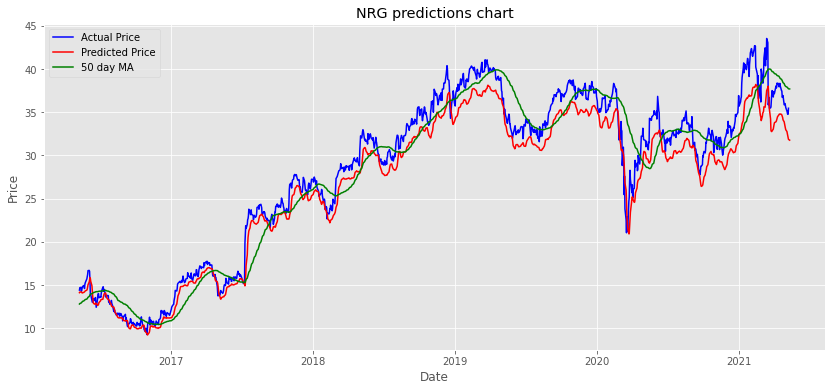

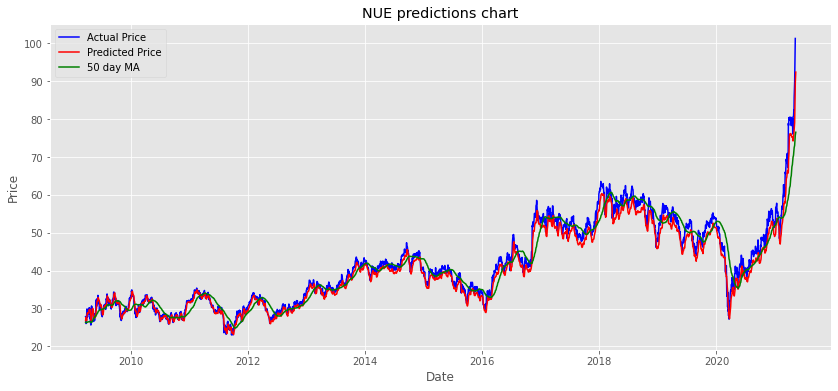

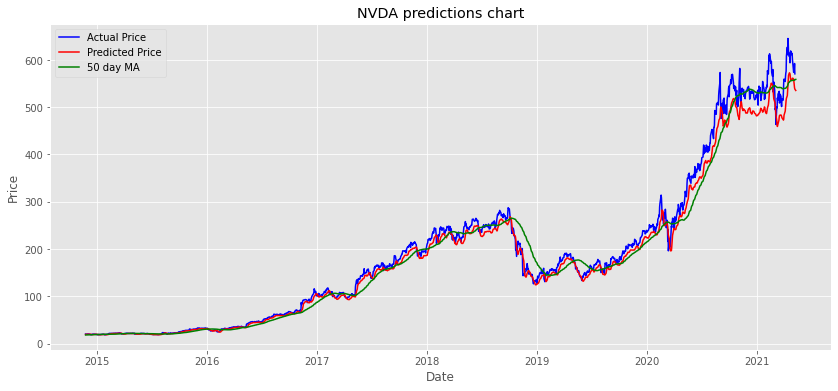

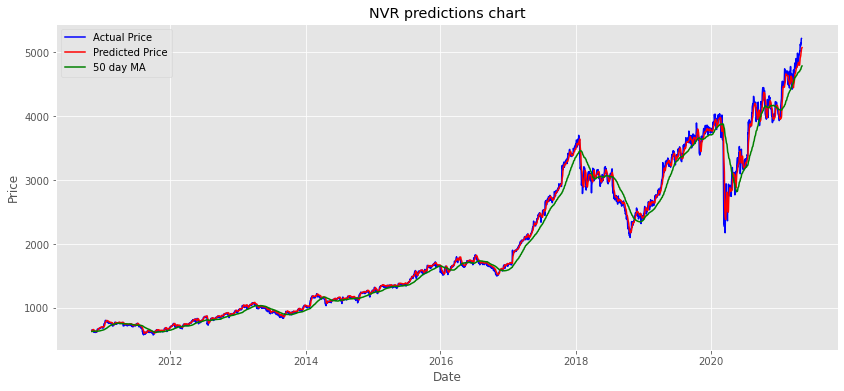

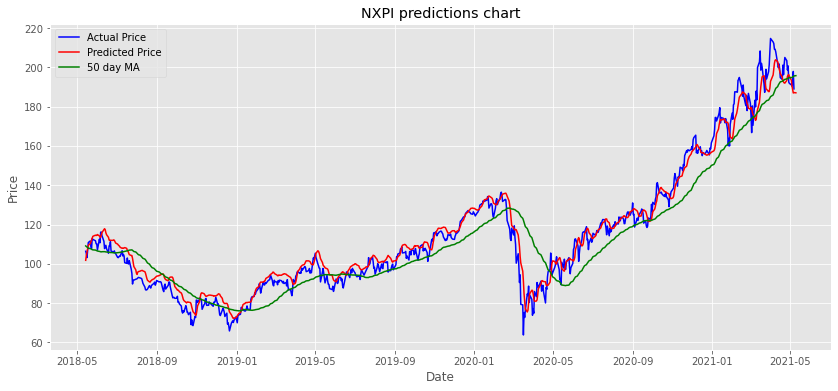

...

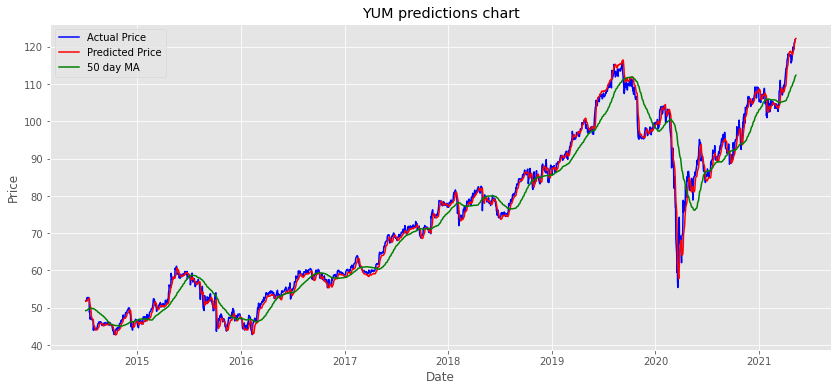

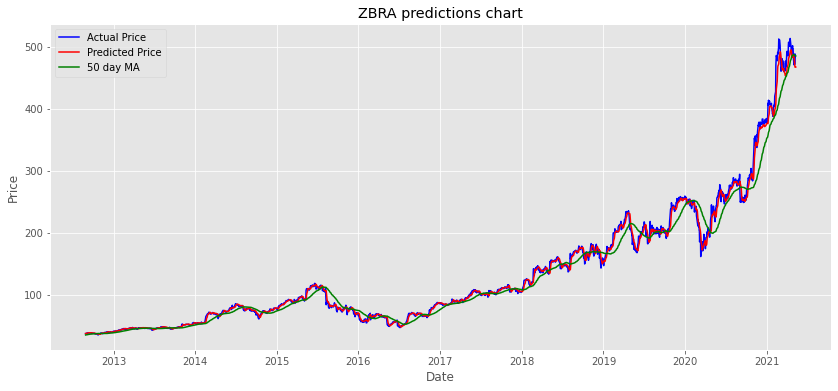

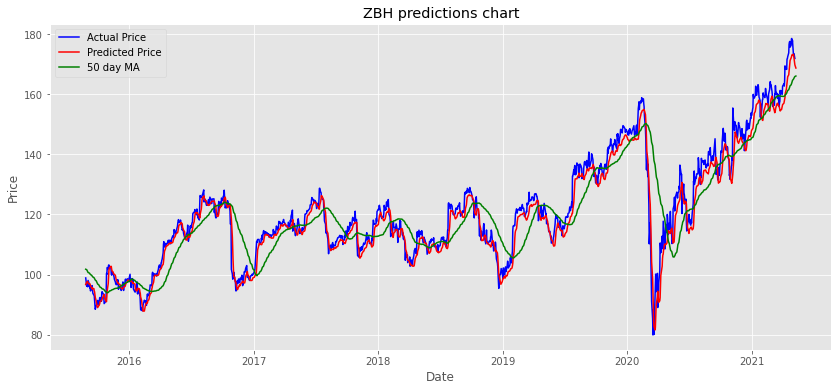

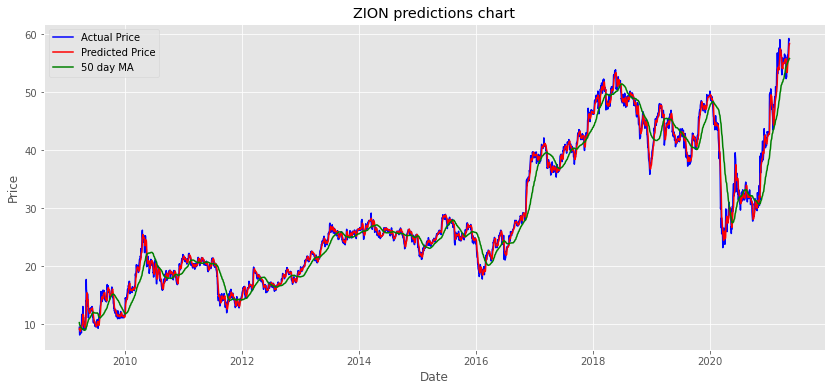

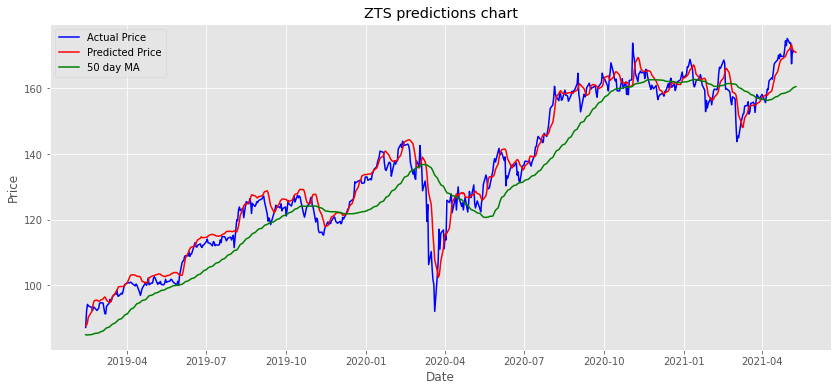

In [11]:
with concurrent.futures.ThreadPoolExecutor() as executor:
  predict_model_master("sp500")